# TSP Essay
A fun study of some heuristics for the Travelling Salesman Problem.

---
I've always found the Travelling salesman problem particularly interesting.
After studying a few papers on the subject (in this repository too), mainly the superb `Clarke & Wright's Savings Algorithm` from 1997, I fell like trying a few techniques.

To see the original `ipynb` format (probably better): [https://github.com/rsalmei/tsp-essay/blob/master/tsp_essay.ipynb](https://github.com/rsalmei/tsp-essay/blob/master/tsp_essay.ipynb)

To run this yourself, you need:

- a recent python (I'm using 3.6.5)
- a virtualenv
- `pip install -r requirements.txt`
- `jupyter notebook tsp_essay.ipynb`

Enjoy :)

# Setup environment

In [1]:
import pandas as pd
import numpy as np

%matplotlib inline
%config InlineBackend.figure_format = 'retina'
import matplotlib.pyplot as plt
from pylab import rcParams

/Users/rogerio/.pyenv/versions/3.6.5/lib/python3.6/importlib/_bootstrap.py:219: RuntimeWarning: numpy.dtype size changed, may indicate binary incompatibility. Expected 96, got 88
  return f(*args, **kwds)
/Users/rogerio/.pyenv/versions/3.6.5/lib/python3.6/importlib/_bootstrap.py:219: RuntimeWarning: numpy.dtype size changed, may indicate binary incompatibility. Expected 96, got 88
  return f(*args, **kwds)


## Customize graphics style

In [2]:
print(plt.style.available)

['seaborn-dark', 'seaborn-darkgrid', 'seaborn-ticks', 'fivethirtyeight', 'seaborn-whitegrid', 'classic', '_classic_test', 'fast', 'seaborn-talk', 'seaborn-dark-palette', 'seaborn-bright', 'seaborn-pastel', 'grayscale', 'seaborn-notebook', 'ggplot', 'seaborn-colorblind', 'seaborn-muted', 'seaborn', 'Solarize_Light2', 'seaborn-paper', 'bmh', 'tableau-colorblind10', 'seaborn-white', 'dark_background', 'seaborn-poster', 'seaborn-deep']


In [3]:
plt.style.use('classic')
rcParams['figure.figsize'] = 16, 10

# Initialize data

In [4]:
np.random.seed(18)

size, cmin, cmax = 150, -100, 100
data = pd.DataFrame(dict(x=[0], y=[0])).append(
    pd.DataFrame((np.random.random_sample(2*size)*(cmax-cmin)+cmin).reshape(-1,2), columns=['x', 'y']), ignore_index=True)
data

,x,y
0,0.000000,0.000000
1,30.074848,1.090675
2,75.720294,-63.631955
3,70.446614,50.027257
4,33.220333,97.579090
5,-48.606315,-94.338815
6,27.143823,69.462477
7,47.234925,-95.838578
8,-77.679374,-40.455252
9,37.394038,72.325211


## Plot problem

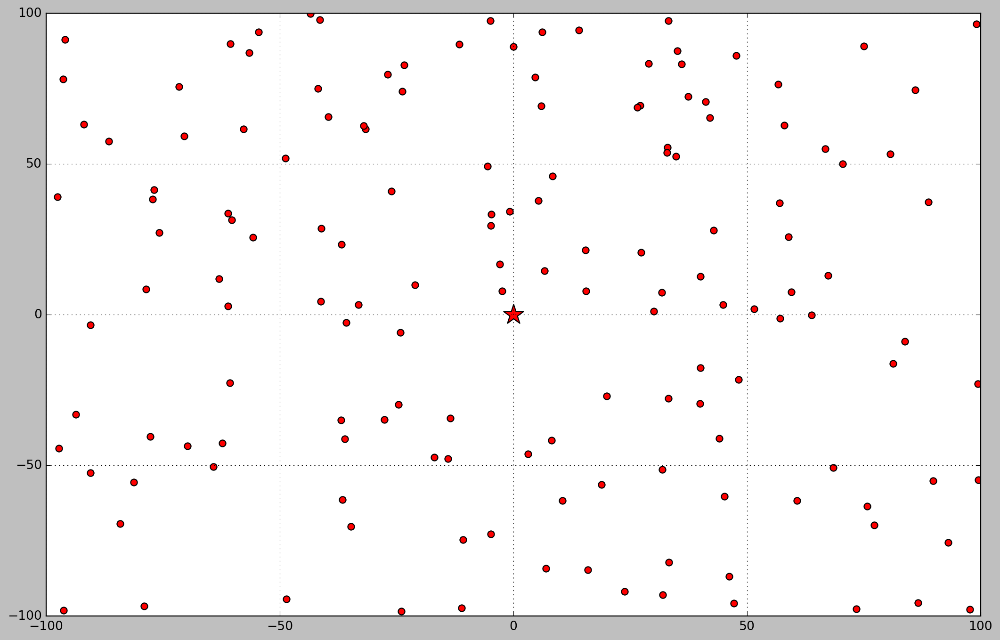

In [5]:
plt.scatter(data.x, data.y, c='r', marker='o', s=40)
plt.scatter(data.iloc[0].x, data.iloc[0].y, marker='*', c='r', s=400)
plt.axis([-100,100,-100,100])
plt.grid(True)

# Compute distance matrix

In [6]:
distance_func = lambda a,b: np.sqrt((a.x-b.x)**2 + (a.y-b.y)**2)
def compute_distances(dfunc=distance_func):
    for i in range(size+1):
        current=data.iloc[i]
        data[i]=dfunc(current, data)
        #data[str(i)][i]=np.nan

%time compute_distances()
data

CPU times: user 346 ms, sys: 5.93 ms, total: 352 ms
Wall time: 357 ms


,x,y,0,1,2,3,4,5,6,7,...,141,142,143,144,145,146,147,148,149,150
0,0.000000,0.000000,0.000000,30.094619,98.906970,86.402846,103.078947,106.124389,74.577630,106.846484,...,59.528289,48.525504,79.048708,88.182216,69.747483,60.216973,61.156032,26.391096,73.713707,64.129271
1,30.074848,1.090675,30.094619,0.000000,79.199277,63.440275,96.539672,123.683115,68.434599,98.436519,...,58.616164,68.857475,108.921496,82.214930,96.802687,44.383034,91.180819,25.020186,67.768880,93.714821
2,75.720294,-63.631955,98.906970,79.199277,0.000000,113.781493,166.719068,128.062552,141.682044,42.996311,...,57.276463,145.932898,170.304863,154.196790,167.877766,38.886864,152.116365,104.218532,141.236354,157.968538
3,70.446614,50.027257,86.402846,63.440275,113.781493,0.000000,60.390171,187.123389,47.464297,147.701132,...,118.299618,96.980912,154.751471,53.194391,132.536951,94.792692,139.732470,62.001337,47.732738,138.795084
4,33.220333,97.579090,103.078947,96.539672,166.719068,60.390171,0.000000,208.633848,28.765741,193.924735,...,154.693357,82.044400,143.027539,14.908663,113.910385,139.028595,133.655082,78.229684,29.574281,128.838562
5,-48.606315,-94.338815,106.124389,123.683115,128.062552,187.123389,208.633848,0.000000,180.468687,95.852974,...,77.408944,137.103775,107.028154,193.825565,128.622553,106.925989,98.008518,132.278609,179.587519,107.224850
6,27.143823,69.462477,74.577630,68.434599,141.682044,47.464297,28.765741,180.468687,0.000000,166.517540,...,126.181957,60.422310,122.108842,13.951546,95.203204,111.777718,110.540955,49.469965,0.916230,106.958325
7,47.234925,-95.838578,106.846484,98.436519,42.996311,147.701132,193.924735,95.852974,166.517540,0.000000,...,48.524090,155.169851,163.402757,180.068054,168.837654,54.904573,146.552646,121.463982,165.901224,154.159518
8,-77.679374,-40.455252,87.582604,115.486087,155.140639,173.575323,177.065594,61.226474,151.887491,136.641483,...,97.890812,96.330687,48.864310,163.348464,75.969024,121.760819,46.394717,111.798720,150.972491,54.384039
9,37.394038,72.325211,81.420208,71.609564,141.255984,39.870685,25.596449,187.544551,10.642469,168.451485,...,130.096654,70.846519,132.443410,13.851032,105.784607,113.546950,120.509879,55.456475,11.415928,117.179733


## Helper functions

In [7]:
estimate_cost = lambda route: sum(data.iloc[i][j] for i,j in zip(route, route[1:]))
get_coords = lambda route: list(zip(*[(data.iloc[i].x,data.iloc[i].y) for i in route]))

# Scenario: center depot, one van, nearest neighbor heuristic

## Apply a greedy NN algorithm

In [8]:
def nearest_neighbor(unserved, stop_condition=lambda route, target: False):
    current=0 #depot
    result_path=[]
    while True:
        result_path.append(current)
        unserved.remove(current)
        if not unserved:
            break

        current=data.iloc[unserved,current+2].idxmin()
        if stop_condition(result_path, int(current)):
            if len(result_path)>1:
                break

    result_path.append(0)
    return result_path

%time route = nearest_neighbor(list(range(size+1)))
print('cost={}\nroute={}'.format(estimate_cost(route),route))

CPU times: user 116 ms, sys: 8.29 ms, total: 125 ms
Wall time: 122 ms
cost=2623.828598616268
route=[0, 53, 60, 20, 66, 148, 55, 51, 1, 120, 104, 123, 74, 93, 130, 42, 29, 19, 91, 107, 81, 11, 134, 117, 57, 30, 34, 67, 75, 46, 39, 131, 16, 114, 72, 96, 38, 22, 122, 92, 36, 126, 113, 7, 58, 111, 28, 108, 63, 2, 137, 50, 128, 69, 141, 18, 146, 37, 54, 95, 24, 121, 35, 83, 3, 49, 12, 73, 105, 129, 90, 144, 9, 86, 132, 31, 70, 127, 149, 6, 71, 41, 140, 76, 102, 32, 100, 97, 139, 88, 78, 26, 17, 135, 27, 13, 110, 89, 59, 119, 40, 15, 56, 145, 10, 106, 82, 94, 115, 87, 98, 44, 64, 52, 14, 33, 136, 124, 65, 142, 150, 147, 143, 109, 112, 23, 47, 101, 45, 138, 99, 133, 8, 48, 62, 80, 103, 43, 68, 61, 125, 21, 25, 118, 5, 79, 116, 77, 85, 84, 4, 0]


## Plot result path

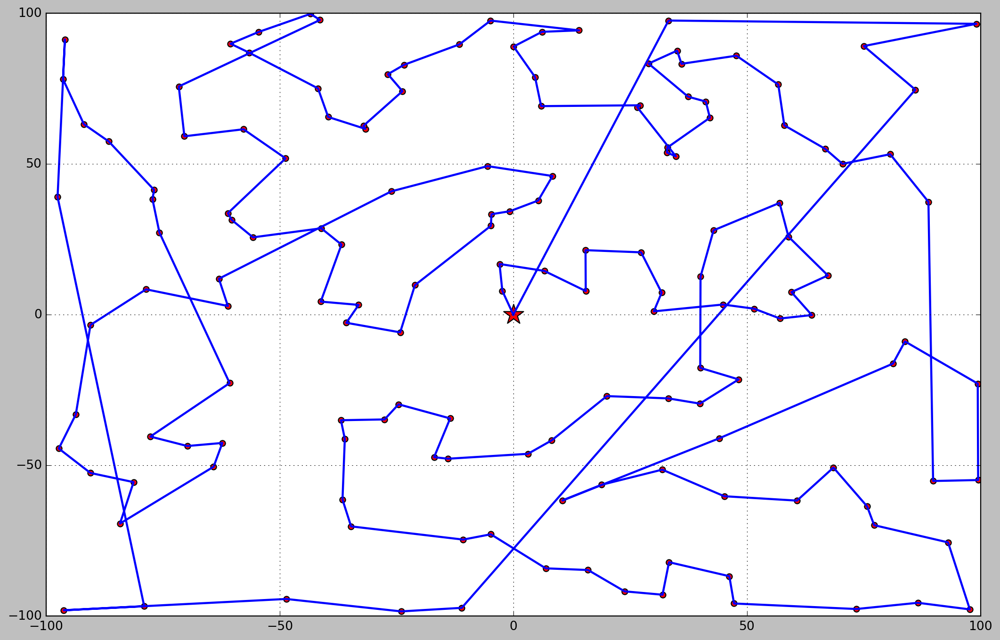

In [9]:
coords=get_coords(route)
plt.plot(coords[0], coords[1], 'b-', linewidth=2)
plt.scatter(data.x, data.y, c='r', s=30)
plt.scatter(data.iloc[0].x, data.iloc[0].y, marker='*', c='r', s=400)
plt.axis([-100,100,-100,100])
plt.grid(True)

## Let's improve it with a 2-opt heuristic

In [10]:
def twoOptSwap(route,i,j):
    t=route[i:j+1];
    t.reverse();
    route[i:j+1]=t

def twoOpt(route):
    cost=estimate_cost(route)

    def inner():
        nonlocal cost
        for i in range(1,len(route)-2):
            nodei=data.iloc[route[i]]
            for j in range(i+1,len(route)-1):
                nodej=data.iloc[route[j]]
                save=nodei.iloc[route[i-1]+2]+nodej.iloc[route[j+1]+2] - (nodej.iloc[route[i-1]+2]+nodei.iloc[route[j+1]+2])
                if save>0:
                    twoOptSwap(route,i,j)

                    cost-=save
                    print('exchanging {}-{},{}-{} with {}-{},{}-{} => save={} => cost: {}'.format(
                            route[i-1],route[i],route[j],route[j+1],route[i-1],route[j],route[i],route[j+1],save,cost))
                    return False
        return True

    while True:
        if inner():
            break

%time twoOpt(route)

exchanging 53-64,60-52 with 53-60,64-52 => save=2.8803537373675177 => cost: 2620.948244878901
exchanging 53-4,64-0 with 53-64,4-0 => save=2.1646493955605024 => cost: 2618.7835954833404
exchanging 53-150,4-142 with 53-4,150-142 => save=0.5913895920361654 => cost: 2618.192205891304
exchanging 53-147,150-143 with 53-150,147-143 => save=4.232088018183788 => cost: 2613.9601178731205
exchanging 53-48,147-62 with 53-147,48-62 => save=16.791995889494686 => cost: 2597.168121983626
exchanging 53-21,48-25 with 53-48,21-25 => save=26.51864663222443 => cost: 2570.6494753514016
exchanging 53-43,21-103 with 53-21,43-103 => save=0.4135489632104594 => cost: 2570.2359263881913
exchanging 53-125,43-21 with 53-43,125-21 => save=3.198442998873162 => cost: 2567.037483389318
exchanging 53-116,125-77 with 53-125,116-77 => save=34.557040956073024 => cost: 2532.480442433245
exchanging 53-117,116-57 with 53-116,117-57 => save=24.084477030746356 => cost: 2508.395965402499
exchanging 53-64,117-0 with 53-117,64-0 =

## Plot improved path

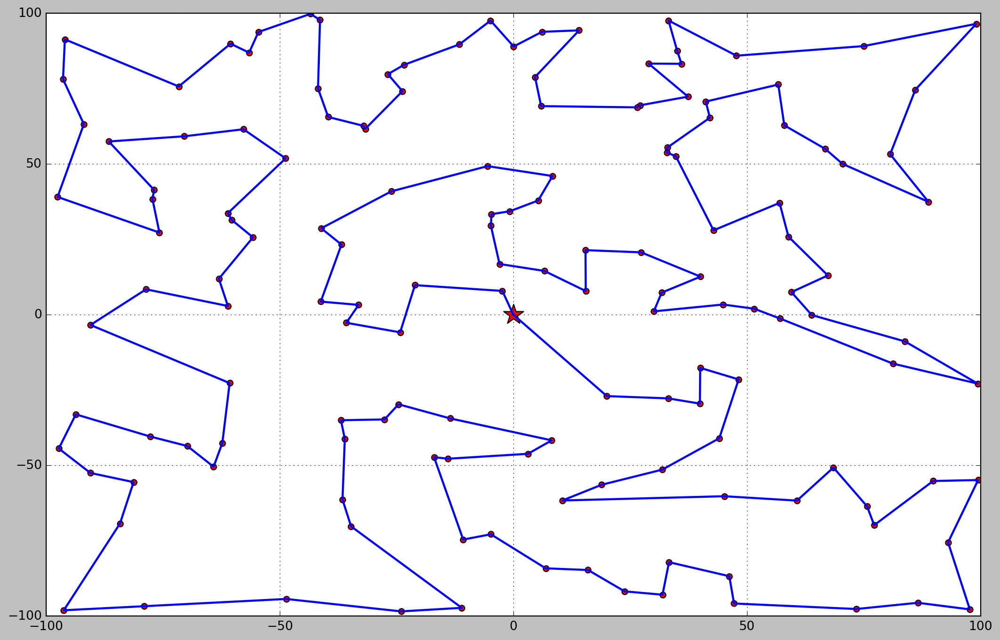

In [11]:
coords=get_coords(route)
plt.plot(coords[0], coords[1], 'b-', linewidth=2)
plt.scatter(data.x, data.y, c='r', s=30)
plt.scatter(data.iloc[0].x, data.iloc[0].y, marker='*', c='r', s=400)
plt.axis([-100,100,-100,100])
plt.grid(True)

## Incredible! A clean path, without any crossing parts!

# Scenario: center depot, one van, 2-opt heuristic

## Just for fun, let's pass a random route to 2-opt heuristic

In [12]:
route = [x for x in range(size+1)]+[0]
print('cost={}\nroute={}'.format(estimate_cost(route),route))

cost=16332.039263088578
route=[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 0]


## Plot result path

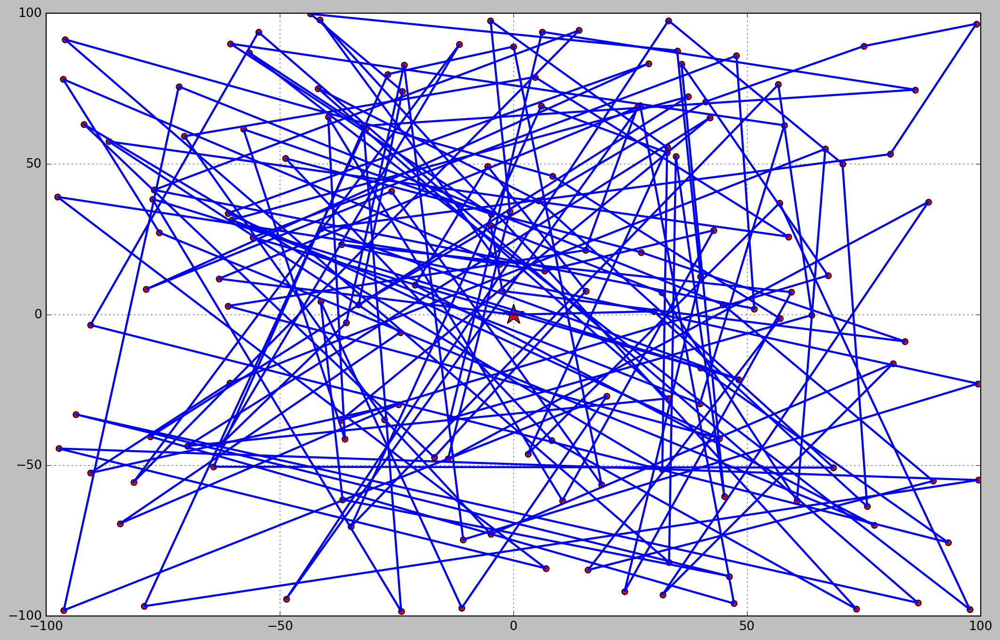

In [13]:
coords=get_coords(route)
plt.plot(coords[0], coords[1], 'b-', linewidth=2)
plt.scatter(data.x, data.y, c='r', s=30)
plt.scatter(data.iloc[0].x, data.iloc[0].y, marker='*', c='r', s=400)
plt.axis([-100,100,-100,100])
plt.grid(True)

## Let's see what 2-opt heuristic can do

In [14]:
%time twoOpt(route)

exchanging 0-4,1-5 with 0-1,4-5 => save=11.966404491447804 => cost: 16320.07285859713
exchanging 0-5,4-6 with 0-4,5-6 => save=148.65750376301747 => cost: 16171.415354834113
exchanging 0-1,5-2 with 0-5,1-2 => save=27.16649580822525 => cost: 16144.248859025887
exchanging 0-6,1-7 with 0-1,6-7 => save=23.598010199272267 => cost: 16120.650848826615
exchanging 0-5,6-1 with 0-6,5-1 => save=23.701757832884823 => cost: 16096.94909099373
exchanging 0-1,5-7 with 0-5,1-7 => save=78.61331452985205 => cost: 16018.335776463879
exchanging 0-8,1-9 with 0-1,8-9 => save=32.02762827443513 => cost: 15986.308148189444
exchanging 0-7,8-5 with 0-8,7-5 => save=15.362620333873394 => cost: 15970.94552785557
exchanging 0-5,7-2 with 0-7,5-2 => save=85.78833506582373 => cost: 15885.157192789748
exchanging 0-8,5-7 with 0-5,8-7 => save=59.33029366320022 => cost: 15825.826899126547
exchanging 0-9,8-10 with 0-8,9-10 => save=38.07258699930202 => cost: 15787.754312127245
exchanging 0-1,9-6 with 0-9,1-6 => save=109.117718

exchanging 0-41,10-40 with 0-10,41-40 => save=37.05545789102396 => cost: 12831.895099006664
exchanging 0-33,41-14 with 0-41,33-14 => save=2.2486926030474024 => cost: 12829.646406403617
exchanging 0-55,33-20 with 0-33,55-20 => save=0.5031341827701539 => cost: 12829.143272220846
exchanging 0-20,55-49 with 0-55,20-49 => save=38.54949370624065 => cost: 12790.593778514605
exchanging 0-51,20-52 with 0-20,51-52 => save=7.288630432004986 => cost: 12783.3051480826
exchanging 0-50,51-49 with 0-51,50-49 => save=3.6942538376962943 => cost: 12779.610894244903
exchanging 0-1,50-54 with 0-50,1-54 => save=53.479919031311425 => cost: 12726.130975213591
exchanging 0-51,1-50 with 0-1,51-50 => save=2.483256363292867 => cost: 12723.647718850298
exchanging 0-19,51-1 with 0-51,19-1 => save=4.739991329320262 => cost: 12718.907727520977
exchanging 0-6,19-29 with 0-19,6-29 => save=3.8288852656740886 => cost: 12715.078842255303
exchanging 0-55,6-49 with 0-6,55-49 => save=50.377030275578306 => cost: 12664.7018119

exchanging 0-33,77-41 with 0-77,33-41 => save=42.93531582031224 => cost: 10451.221215493006
exchanging 0-15,33-14 with 0-33,15-14 => save=5.981987065707244 => cost: 10445.2392284273
exchanging 0-17,15-13 with 0-15,17-13 => save=11.283830785971006 => cost: 10433.955397641328
exchanging 0-26,17-27 with 0-17,26-27 => save=15.535297873636495 => cost: 10418.42009976769
exchanging 0-42,26-41 with 0-26,42-41 => save=40.60486722048617 => cost: 10377.815232547204
exchanging 0-41,42-77 with 0-42,41-77 => save=11.040404309949338 => cost: 10366.774828237254
exchanging 0-27,41-32 with 0-41,27-32 => save=7.032912487789247 => cost: 10359.741915749464
exchanging 0-17,27-15 with 0-27,17-15 => save=20.20361339747923 => cost: 10339.538302351984
exchanging 0-26,17-41 with 0-17,26-41 => save=1.2938500338021584 => cost: 10338.244452318182
exchanging 0-76,26-78 with 0-26,76-78 => save=23.51396307232166 => cost: 10314.73048924586
exchanging 0-35,76-31 with 0-76,35-31 => save=9.501080946350612 => cost: 10305.2

exchanging 0-69,136-66 with 0-136,69-66 => save=7.493424228148044 => cost: 7607.568531907637
exchanging 0-81,69-79 with 0-69,81-79 => save=40.21939651149418 => cost: 7567.3491353961435
exchanging 0-92,81-93 with 0-81,92-93 => save=32.36098293778147 => cost: 7534.9881524583625
exchanging 0-47,92-38 with 0-92,47-38 => save=43.95011466854149 => cost: 7491.038037789821
exchanging 0-48,47-45 with 0-47,48-45 => save=74.0728883198484 => cost: 7416.965149469973
exchanging 0-38,48-39 with 0-48,38-39 => save=0.8793247572327942 => cost: 7416.08582471274
exchanging 0-92,38-45 with 0-38,92-45 => save=9.049573098857309 => cost: 7407.036251613883
exchanging 0-39,92-67 with 0-92,39-67 => save=6.539123122846391 => cost: 7400.497128491036
exchanging 0-72,39-46 with 0-39,72-46 => save=1.9138443886005234 => cost: 7398.583284102436
exchanging 0-67,72-92 with 0-72,67-92 => save=26.09579930781402 => cost: 7372.487484794622
exchanging 0-48,67-39 with 0-67,48-39 => save=4.301085562952679 => cost: 7368.18639923

exchanging 33-62,59-78 with 33-59,62-78 => save=19.911939449297833 => cost: 5849.887299903874
exchanging 52-33,14-62 with 52-14,33-62 => save=1.5487066171558865 => cost: 5848.338593286718
exchanging 14-26,62-13 with 14-62,26-13 => save=8.079982972097739 => cost: 5840.25861031462
exchanging 52-14,33-26 with 52-33,14-26 => save=0.30375069532139065 => cost: 5839.954859619298
exchanging 33-87,26-80 with 33-26,87-80 => save=1.6638418353760471 => cost: 5838.291017783922
exchanging 20-33,60-87 with 20-60,33-87 => save=0.517223004504892 => cost: 5837.773794779418
exchanging 20-66,33-148 with 20-33,66-148 => save=2.8860038141464415 => cost: 5834.887790965271
exchanging 53-87,20-60 with 53-20,87-60 => save=3.2732421016582194 => cost: 5831.614548863613
exchanging 53-56,87-64 with 53-87,56-64 => save=3.8208863316602333 => cost: 5827.793662531953
exchanging 53-101,56-103 with 53-56,101-103 => save=29.670075151937652 => cost: 5798.123587380015
exchanging 53-99,101-34 with 53-101,99-34 => save=3.7692

exchanging 142-56,103-145 with 142-103,56-145 => save=30.033490050306668 => cost: 4555.3155371823395
exchanging 142-10,56-13 with 142-56,10-13 => save=8.28546187125454 => cost: 4547.030075311085
exchanging 94-142,82-10 with 94-82,142-10 => save=2.368952512920906 => cost: 4544.661122798164
exchanging 145-61,103-62 with 145-103,61-62 => save=1.5449750341036008 => cost: 4543.11614776406
exchanging 145-17,61-27 with 145-61,17-27 => save=4.746176540525539 => cost: 4538.369971223534
exchanging 94-145,142-17 with 94-142,145-17 => save=4.504085834844332 => cost: 4533.865885388689
exchanging 150-94,106-145 with 150-106,94-145 => save=3.7632910163050752 => cost: 4530.102594372384
exchanging 64-94,87-115 with 64-87,94-115 => save=4.269416387552621 => cost: 4525.833177984831
exchanging 64-115,94-106 with 64-94,115-106 => save=6.5045769062198175 => cost: 4519.328601078611
exchanging 64-87,115-98 with 64-115,87-98 => save=4.761629685919978 => cost: 4514.566971392692
exchanging 150-10,94-82 with 150-

exchanging 77-3,49-12 with 77-49,3-12 => save=4.4963924839478295 => cost: 3694.2423593061394
exchanging 77-83,3-104 with 77-3,83-104 => save=14.356214437392524 => cost: 3679.8861448687467
exchanging 83-3,35-104 with 83-35,3-104 => save=7.286198367222447 => cost: 3672.5999465015243
exchanging 3-29,19-55 with 3-19,29-55 => save=33.37066510379271 => cost: 3639.2292813977315
exchanging 3-149,29-42 with 3-29,149-42 => save=13.310135577693039 => cost: 3625.9191458200385
exchanging 3-132,149-55 with 3-149,132-55 => save=14.41323029472727 => cost: 3611.505915525311
exchanging 3-51,132-49 with 3-132,51-49 => save=6.987490463731731 => cost: 3604.5184250615794
exchanging 3-35,51-42 with 3-51,35-42 => save=34.57918188922163 => cost: 3569.9392431723577
exchanging 35-74,104-1 with 35-104,74-1 => save=18.673762586561935 => cost: 3551.2654805857956
exchanging 35-91,74-123 with 35-74,91-123 => save=5.426988670882494 => cost: 3545.838491914913
exchanging 90-144,105-129 with 90-105,144-129 => save=0.3050

exchanging 128-50,28-2 with 128-28,50-2 => save=23.47096008797149 => cost: 2745.875950346595
exchanging 50-28,24-2 with 50-24,28-2 => save=2.989067217651879 => cost: 2742.886883128943
exchanging 50-2,28-63 with 50-28,2-63 => save=8.313384733108109 => cost: 2734.5734983958346
exchanging 50-137,2-58 with 50-2,137-58 => save=14.748475557233327 => cost: 2719.8250228386014
exchanging 95-121,108-63 with 95-108,121-63 => save=21.8899739983068 => cost: 2697.9350488402947
exchanging 95-24,121-2 with 95-121,24-2 => save=10.56944978162042 => cost: 2687.3655990586744
exchanging 24-63,28-108 with 24-28,63-108 => save=10.235434523765846 => cost: 2677.1301645349085
exchanging 24-108,63-121 with 24-63,108-121 => save=6.435748617351344 => cost: 2670.6944159175573
exchanging 24-121,108-2 with 24-108,121-2 => save=7.435412104434153 => cost: 2663.259003813123
exchanging 121-108,63-2 with 121-63,108-2 => save=13.349761530610763 => cost: 2649.909242282512
exchanging 121-2,108-58 with 121-108,2-58 => save=8.

## Plot improved path

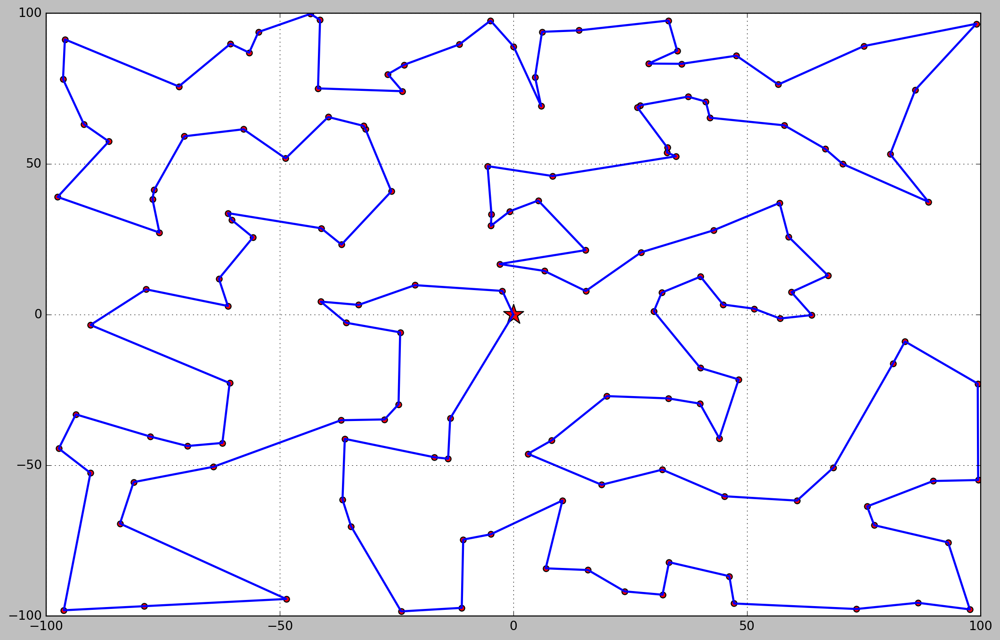

In [15]:
coords=get_coords(route)
plt.plot(coords[0], coords[1], 'b-', linewidth=2)
plt.scatter(data.x, data.y, c='r', s=30)
plt.scatter(data.iloc[0].x, data.iloc[0].y, marker='*', c='r', s=400)
plt.axis([-100,100,-100,100])
plt.grid(True)

## WOW, very cool, a clean path too, almost as good as the previous one.

## But extremely slower... It took ~19 minutes, while NN + 2-opt took only ~3 minutes.

# Scenario: center depot, several vans, no clustering

## Let's apply a sequential NN algorithm, but including a max cost constraint

In [16]:
def sequential_nn(max_cost):
    unserved=list(range(size+1))
    result=[]
    while True:
        result_path = nearest_neighbor(unserved, lambda route, target: estimate_cost(route+[target,0])>=max_cost)
        result.append(result_path)
        print('van {}: {}'.format(len(result), estimate_cost(result_path)))

        if not unserved:
            break
        unserved.append(0)
    return result

%time result_paths = sequential_nn(400)

van 1: 389.0742611200774
van 2: 398.3533734081084
van 3: 397.4195886051539
van 4: 390.9917686566429
van 5: 371.6762623788105
van 6: 320.29683749922486
van 7: 364.8394134778564
van 8: 320.99556479051967
van 9: 210.1189842618746
van 10: 276.59421133431306
CPU times: user 1.48 s, sys: 24.4 ms, total: 1.51 s
Wall time: 1.54 s


## Plot result paths

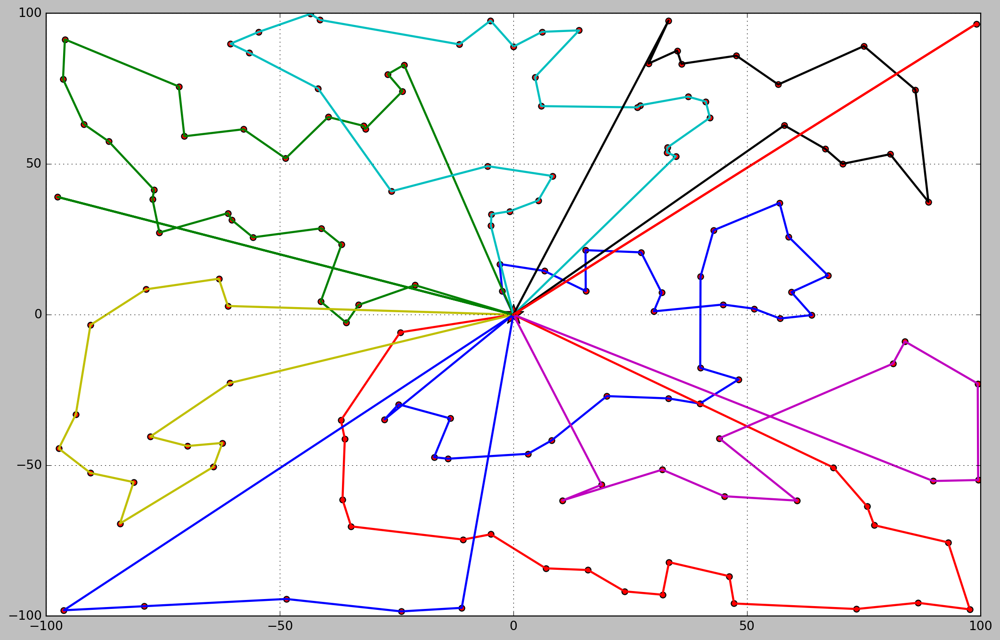

In [17]:
for path in result_paths:
    coords=get_coords(path)
    plt.plot(coords[0], coords[1], linewidth=2)
plt.scatter(data.x, data.y, c='r', s=30)
plt.scatter(data.iloc[0].x, data.iloc[0].y, marker='*', c='r', s=400)
plt.axis([-100,100,-100,100])
plt.grid(True)

## Let's improve them with a 2-opt heuristic

In [18]:
def improve_seq_nn():
    for i,path in enumerate(result_paths):
        print('Starting path {}/{}'.format(i+1, len(result_paths)))
        twoOpt(path)

%time improve_seq_nn()

Starting path 1/10
exchanging 55-19,51-91 with 55-51,19-91 => save=2.6873147586143844 => cost: 386.386946361463
exchanging 120-91,1-107 with 120-1,91-107 => save=13.602846828112977 => cost: 372.78409953335
exchanging 67-39,75-0 with 67-75,39-0 => save=4.275672113835263 => cost: 368.50842741951476
Starting path 2/10
exchanging 17-97,78-0 with 17-78,97-0 => save=0.09782392307953103 => cost: 398.25554948502884
exchanging 17-139,97-88 with 17-97,139-88 => save=2.325143367003488 => cost: 395.93040611802536
exchanging 88-78,26-0 with 88-26,78-0 => save=1.6805548383893267 => cost: 394.249851279636
Starting path 3/10
Starting path 4/10
exchanging 124-127,65-0 with 124-65,127-0 => save=0.5258127779938491 => cost: 390.465955878649
exchanging 14-65,33-0 with 14-33,65-0 => save=3.343148155406432 => cost: 387.1228077232426
Starting path 5/10
exchanging 0-18,141-69 with 0-141,18-69 => save=6.7520080457503155 => cost: 364.9242543330602
exchanging 50-121,146-0 with 50-146,121-0 => save=41.908681513869

## Plot improved paths

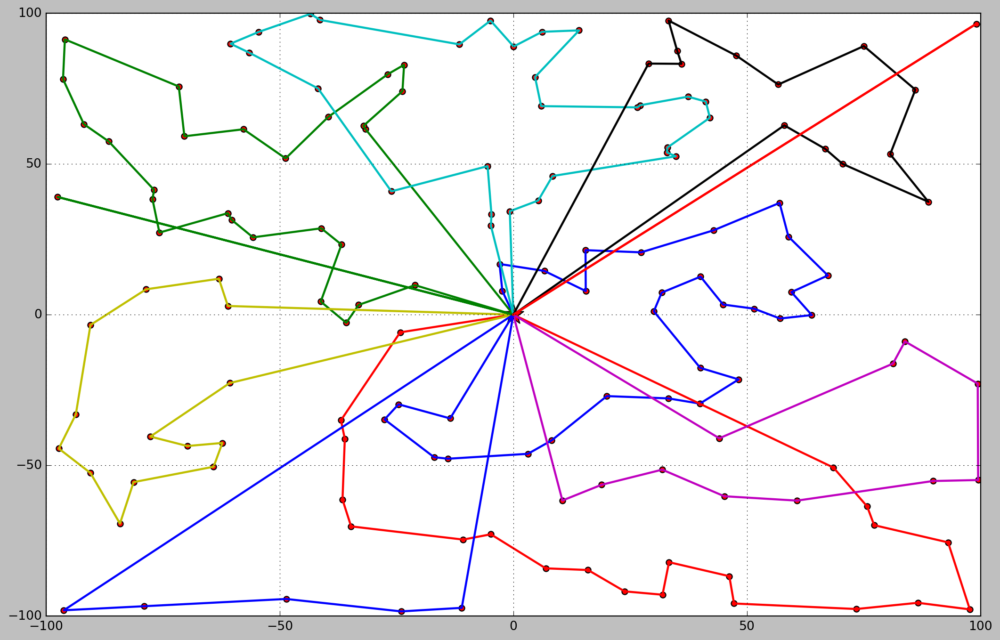

In [19]:
for path in result_paths:
    coords=get_coords(path)
    plt.plot(coords[0], coords[1], linewidth=2)
plt.scatter(data.x, data.y, c='r', s=30)
plt.scatter(data.iloc[0].x, data.iloc[0].y, marker='*', c='r', s=400)
plt.axis([-100,100,-100,100])
plt.grid(True)

## Great! Several clean paths, but with many superpositions, let's improve them once more.

# Scenario: center depot, several vans, KMeans clustering

## Compute delivery clusters

In [20]:
from sklearn.cluster import KMeans

work_per_van=20 #how many deliveries each van will start, ie granularity; a better approach would be capacity.
model = KMeans(n_clusters=1+size//work_per_van, init='k-means++', random_state=0)
%time model.fit(data[['x', 'y']])

CPU times: user 75.7 ms, sys: 4.05 ms, total: 79.7 ms
Wall time: 92.8 ms


KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=8, n_init=10, n_jobs=1, precompute_distances='auto',
    random_state=0, tol=0.0001, verbose=0)

## Plot clusters

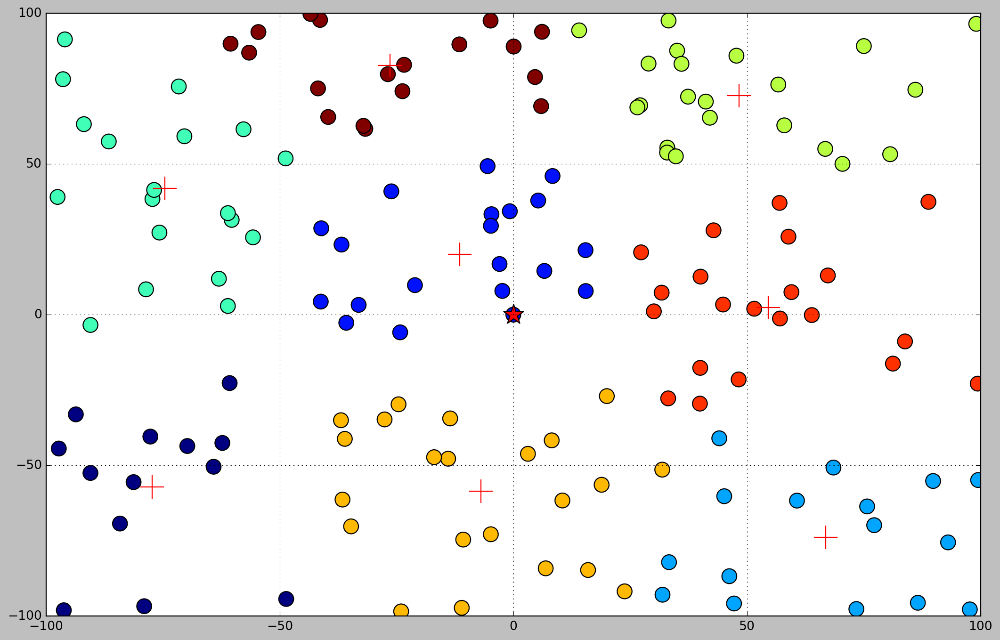

In [21]:
plt.scatter(data.x, data.y, marker='o', c=model.labels_, s=200)
plt.scatter(model.cluster_centers_[:,0], model.cluster_centers_[:,1], marker='+', c='r', s=500)
plt.scatter(data.iloc[0].x, data.iloc[0].y, marker='*', c='r', s=400)
plt.axis([-100,100,-100,100])
plt.grid(True)

## Let's apply a greedy NN algorithm sequentially, on each of the clusters

In [22]:
def greedy_nn_clusters():
    result=[]
    for i in range(model.n_clusters):
        unserved=data[model.labels_ == i].index.tolist()
        if 0 not in unserved:
            unserved.append(0)
        result_path = nearest_neighbor(unserved)
        result.append(result_path)
        print('van {}: {}'.format(i+1, estimate_cost(result_path)))
    return result

%time result_paths = greedy_nn_clusters()

van 1: 409.3080162039939
van 2: 266.4745473994821
van 3: 413.3606064604762
van 4: 446.80922078430706
van 5: 457.66477785115126
van 6: 455.80304195030294
van 7: 459.76894476196577
van 8: 376.5008949566861
CPU times: user 164 ms, sys: 10.1 ms, total: 174 ms
Wall time: 174 ms


## Plot result paths

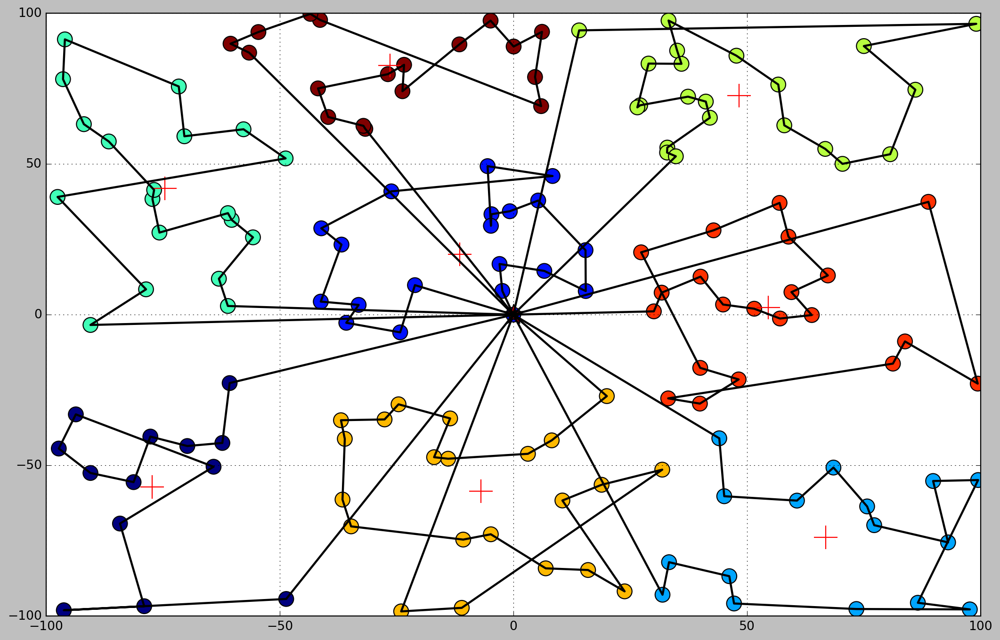

In [23]:
plt.scatter(data.x, data.y, marker='o', c=model.labels_, s=200)
plt.scatter(model.cluster_centers_[:,0], model.cluster_centers_[:,1], marker='+', c='r', s=500)
for path in result_paths:
    coords=get_coords(path)
    plt.plot(coords[0], coords[1], 'k-', linewidth=2)
plt.scatter(data.iloc[0].x, data.iloc[0].y, marker='*', c='r', s=400)
plt.axis([-100,100,-100,100])
plt.grid(True)

## Let's improve them with a 2-opt heuristic

In [24]:
def improve_result_paths():
    for i, path in enumerate(result_paths):
        print('Starting path {}/{}'.format(i+1, len(result_paths)))
        twoOpt(path)

%time improve_result_paths()

Starting path 1/8
exchanging 48-112,99-138 with 48-99,112-138 => save=11.5162692633929 => cost: 397.791746940601
exchanging 45-118,25-5 with 45-25,118-5 => save=13.984640981159586 => cost: 383.8071059594414
Starting path 2/8
exchanging 148-52,136-65 with 148-136,52-65 => save=1.6057804518926915 => cost: 264.8687669475894
exchanging 148-124,52-142 with 148-52,124-142 => save=6.904413311483367 => cost: 257.964353636106
Starting path 3/8
exchanging 63-24,108-111 with 63-108,24-111 => save=11.657922849361384 => cost: 401.7026836111148
exchanging 63-121,24-108 with 63-24,121-108 => save=6.435748617351344 => cost: 395.26693499376347
exchanging 108-28,111-58 with 108-111,28-58 => save=9.304516959883209 => cost: 385.9624180338803
exchanging 113-36,126-0 with 113-126,36-0 => save=7.772149456496223 => cost: 378.1902685773841
Starting path 4/8
exchanging 147-109,150-0 with 147-150,109-0 => save=5.601665728075147 => cost: 441.2075550562319
exchanging 0-106,147-150 with 0-147,106-150 => save=6.1316

## Plot improved paths

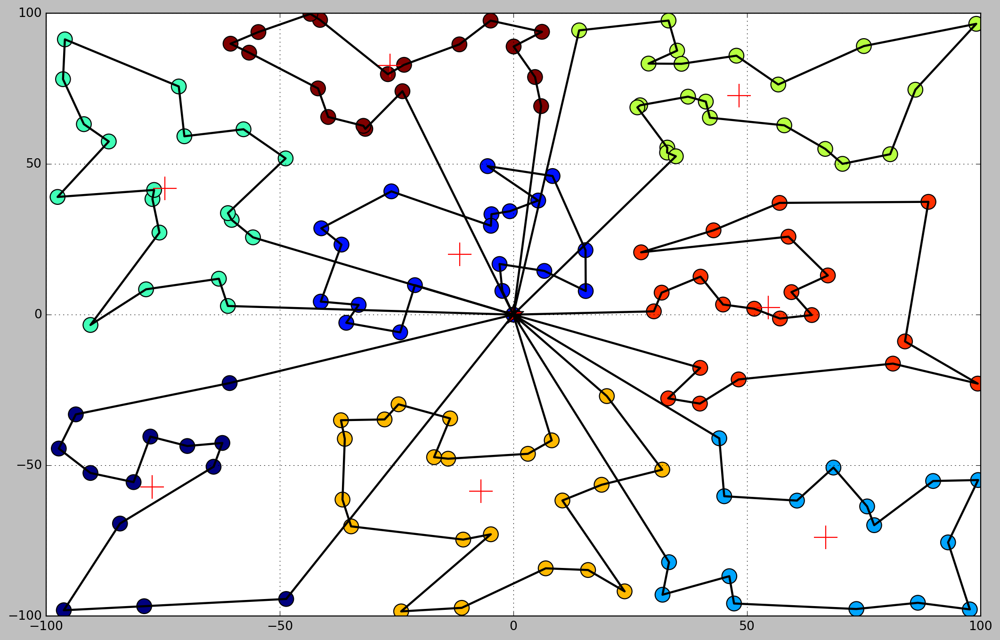

In [25]:
plt.scatter(data.x, data.y, marker='o', c=model.labels_, s=200)
plt.scatter(model.cluster_centers_[:,0], model.cluster_centers_[:,1], marker='+', c='r', s=500)
for path in result_paths:
    coords=get_coords(path)
    plt.plot(coords[0], coords[1], 'k-', linewidth=2)
plt.scatter(data.iloc[0].x, data.iloc[0].y, marker='*', c='r', s=400)
plt.axis([-100,100,-100,100])
plt.grid(True)

## Cool clean paths, with clearly defined cluster subsections!

# Let's change the depot to the farthest point

## Find farthest point and set it as new depot

In [26]:
maxid=data[0].idxmax()
print('farthest point={}; distance={}; coords={}'.format(maxid, data.iloc[maxid,2], tuple(data.iloc[maxid][['x','y']].tolist())))
data.drop(data.columns.difference(['x', 'y']), axis=1, inplace=True)
data.iloc[0]=data.iloc[maxid]
data.drop(maxid, inplace=True)
data.reset_index(drop=True, inplace=True)
size-=1
data

farthest point=84; distance=138.29710566715653; coords=(99.07656719022526, 96.48794364952255)


,x,y
0,99.076567,96.487944
1,30.074848,1.090675
2,75.720294,-63.631955
3,70.446614,50.027257
4,33.220333,97.579090
5,-48.606315,-94.338815
6,27.143823,69.462477
7,47.234925,-95.838578
8,-77.679374,-40.455252
9,37.394038,72.325211


## Plot relocated depot

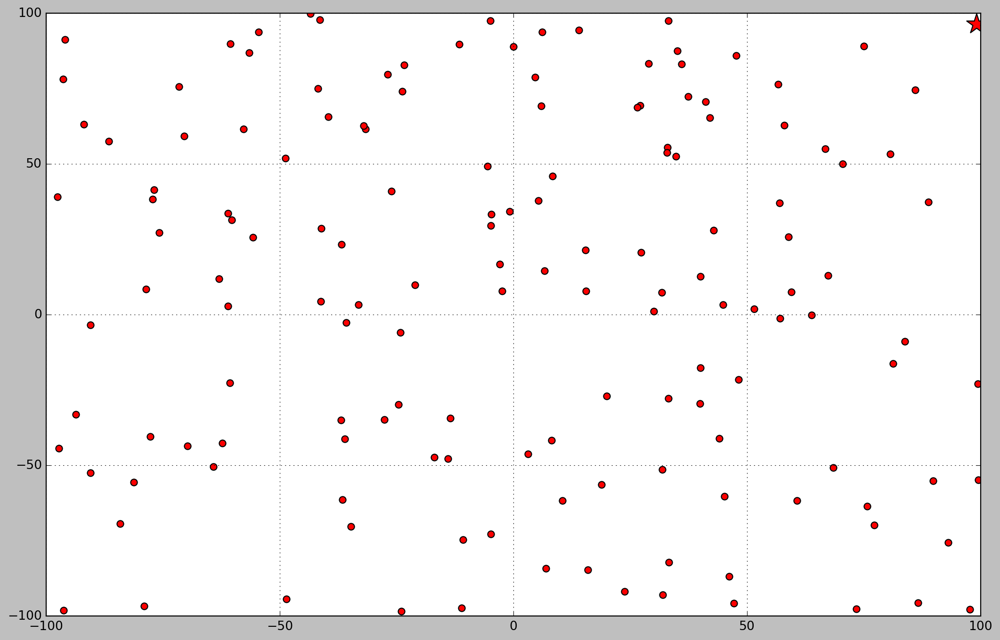

In [27]:
plt.scatter(data.x, data.y, c='r', marker='o', s=40)
plt.scatter(data.iloc[0].x, data.iloc[0].y, marker='*', c='r', s=400)
plt.axis([-100,100,-100,100])
plt.grid(True)

# Recompute distance matrix

In [28]:
%time compute_distances()
data

CPU times: user 365 ms, sys: 5.95 ms, total: 371 ms
Wall time: 374 ms


,x,y,0,1,2,3,4,5,6,7,...,140,141,142,143,144,145,146,147,148,149
0,99.076567,96.487944,0.000000,117.736469,161.814392,54.573525,65.865272,241.298748,76.842016,199.190980,...,172.681309,136.965856,198.314834,71.365094,172.030897,148.102471,185.517910,112.392284,77.646716,182.827181
1,30.074848,1.090675,117.736469,0.000000,79.199277,63.440275,96.539672,123.683115,68.434599,98.436519,...,58.616164,68.857475,108.921496,82.214930,96.802687,44.383034,91.180819,25.020186,67.768880,93.714821
2,75.720294,-63.631955,161.814392,79.199277,0.000000,113.781493,166.719068,128.062552,141.682044,42.996311,...,57.276463,145.932898,170.304863,154.196790,167.877766,38.886864,152.116365,104.218532,141.236354,157.968538
3,70.446614,50.027257,54.573525,63.440275,113.781493,0.000000,60.390171,187.123389,47.464297,147.701132,...,118.299618,96.980912,154.751471,53.194391,132.536951,94.792692,139.732470,62.001337,47.732738,138.795084
4,33.220333,97.579090,65.865272,96.539672,166.719068,60.390171,0.000000,208.633848,28.765741,193.924735,...,154.693357,82.044400,143.027539,14.908663,113.910385,139.028595,133.655082,78.229684,29.574281,128.838562
5,-48.606315,-94.338815,241.298748,123.683115,128.062552,187.123389,208.633848,0.000000,180.468687,95.852974,...,77.408944,137.103775,107.028154,193.825565,128.622553,106.925989,98.008518,132.278609,179.587519,107.224850
6,27.143823,69.462477,76.842016,68.434599,141.682044,47.464297,28.765741,180.468687,0.000000,166.517540,...,126.181957,60.422310,122.108842,13.951546,95.203204,111.777718,110.540955,49.469965,0.916230,106.958325
7,47.234925,-95.838578,199.190980,98.436519,42.996311,147.701132,193.924735,95.852974,166.517540,0.000000,...,48.524090,155.169851,163.402757,180.068054,168.837654,54.904573,146.552646,121.463982,165.901224,154.159518
8,-77.679374,-40.455252,223.598080,115.486087,155.140639,173.575323,177.065594,61.226474,151.887491,136.641483,...,97.890812,96.330687,48.864310,163.348464,75.969024,121.760819,46.394717,111.798720,150.972491,54.384039
9,37.394038,72.325211,66.246298,71.609564,141.255984,39.870685,25.596449,187.544551,10.642469,168.451485,...,130.096654,70.846519,132.443410,13.851032,105.784607,113.546950,120.509879,55.456475,11.415928,117.179733


# Scenario: farthest depot, one van, nearest neighbor heuristic

## Apply a greedy NN algorithm

In [29]:
%time route = nearest_neighbor(list(range(size+1)))
print('cost={}\nroute={}'.format(estimate_cost(route),route))

CPU times: user 111 ms, sys: 13.4 ms, total: 124 ms
Wall time: 118 ms
cost=2598.9001149206997
route=[0, 84, 77, 83, 3, 49, 12, 73, 104, 128, 89, 143, 9, 85, 131, 31, 70, 126, 148, 6, 71, 41, 139, 76, 101, 32, 99, 96, 138, 87, 78, 26, 17, 134, 27, 13, 109, 88, 59, 118, 40, 15, 56, 144, 10, 105, 82, 93, 114, 86, 97, 44, 64, 53, 60, 20, 66, 147, 55, 51, 1, 119, 103, 122, 74, 92, 129, 42, 29, 19, 90, 106, 81, 11, 133, 116, 57, 30, 34, 67, 75, 46, 39, 130, 16, 113, 72, 95, 38, 22, 121, 91, 36, 125, 112, 7, 58, 110, 28, 107, 63, 2, 136, 50, 127, 69, 140, 18, 145, 37, 54, 94, 24, 120, 35, 123, 135, 33, 14, 52, 65, 141, 149, 146, 142, 108, 111, 23, 47, 100, 45, 137, 98, 132, 8, 48, 62, 80, 102, 43, 68, 61, 124, 21, 25, 117, 5, 79, 115, 4, 0]


## Plot result path

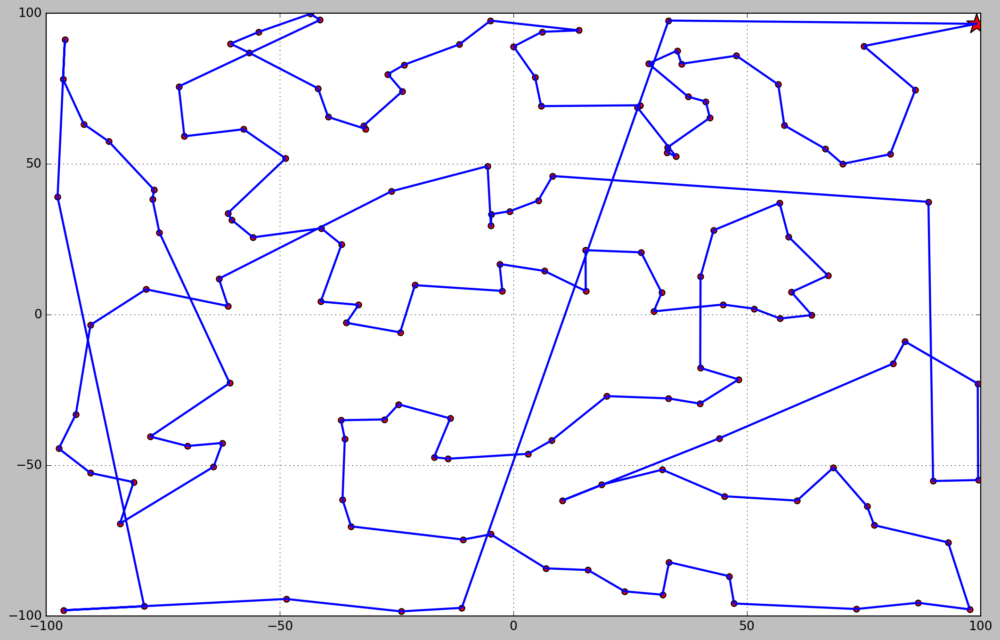

In [30]:
coords=get_coords(route)
plt.plot(coords[0], coords[1], 'b-', linewidth=2)
plt.scatter(data.x, data.y, c='r', s=30)
plt.scatter(data.iloc[0].x, data.iloc[0].y, marker='*', c='r', s=400)
plt.axis([-100,100,-100,100])
plt.grid(True)

## Let's improve it with a 2-opt heuristic

In [31]:
%time twoOpt(route)

exchanging 84-4,77-0 with 84-77,4-0 => save=15.967192548480725 => cost: 2582.932922372219
exchanging 84-9,4-143 with 84-4,9-143 => save=0.3929422221082248 => cost: 2582.5399801501108
exchanging 84-35,9-123 with 84-9,35-123 => save=29.42979962655953 => cost: 2553.110180523551
exchanging 84-73,35-12 with 84-35,73-12 => save=4.825366921724864 => cost: 2548.2848136018265
exchanging 104-4,128-115 with 104-128,4-115 => save=6.731812218973715 => cost: 2541.553001382853
exchanging 4-89,143-128 with 4-143,89-128 => save=2.179914907926989 => cost: 2539.373086474926
exchanging 89-128,143-115 with 89-143,128-115 => save=4.5788246633040615 => cost: 2534.7942618116217
exchanging 143-62,115-48 with 143-115,62-48 => save=28.749134644439096 => cost: 2506.0451271671827
exchanging 143-124,62-21 with 143-62,124-21 => save=21.086297499263537 => cost: 2484.9588296679194
exchanging 143-6,124-71 with 143-124,6-71 => save=28.103261881326674 => cost: 2456.855567786593
exchanging 143-9,6-123 with 143-6,9-123 => 

## Plot improved path

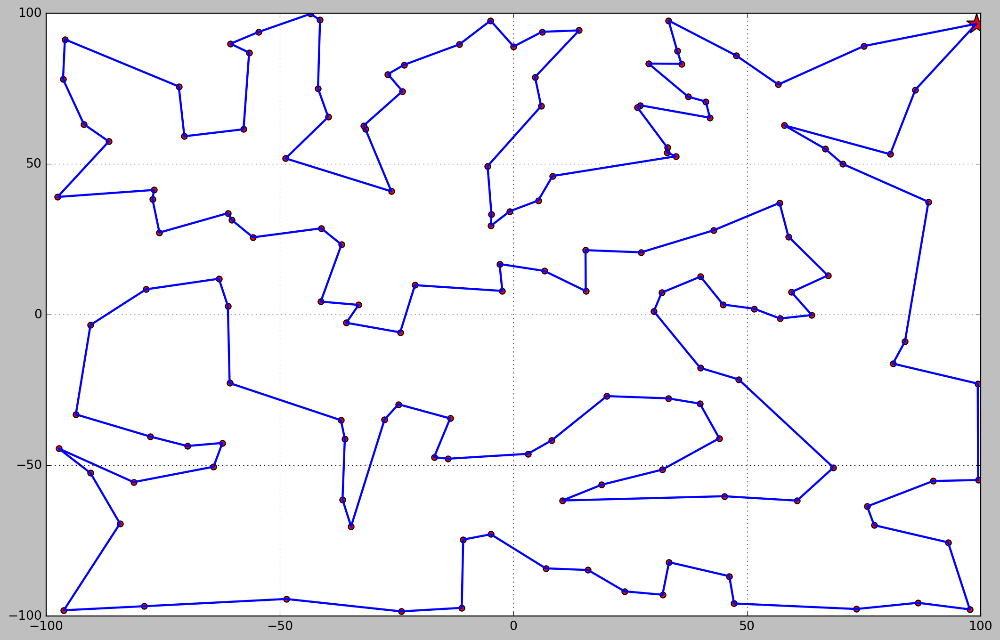

In [32]:
coords=get_coords(route)
plt.plot(coords[0], coords[1], 'b-', linewidth=2)
plt.scatter(data.x, data.y, c='r', s=30)
plt.scatter(data.iloc[0].x, data.iloc[0].y, marker='*', c='r', s=400)
plt.axis([-100,100,-100,100])
plt.grid(True)

## A great optimized route too.

# Scenario: farthest depot, one van, 2-opt heuristic

## Just for fun, let's pass a random route to 2-opt heuristic

In [33]:
route = [x for x in range(size+1)]+[0]
print('cost={}\nroute={}'.format(estimate_cost(route),route))

cost=16502.514122712284
route=[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 0]


## Plot result path

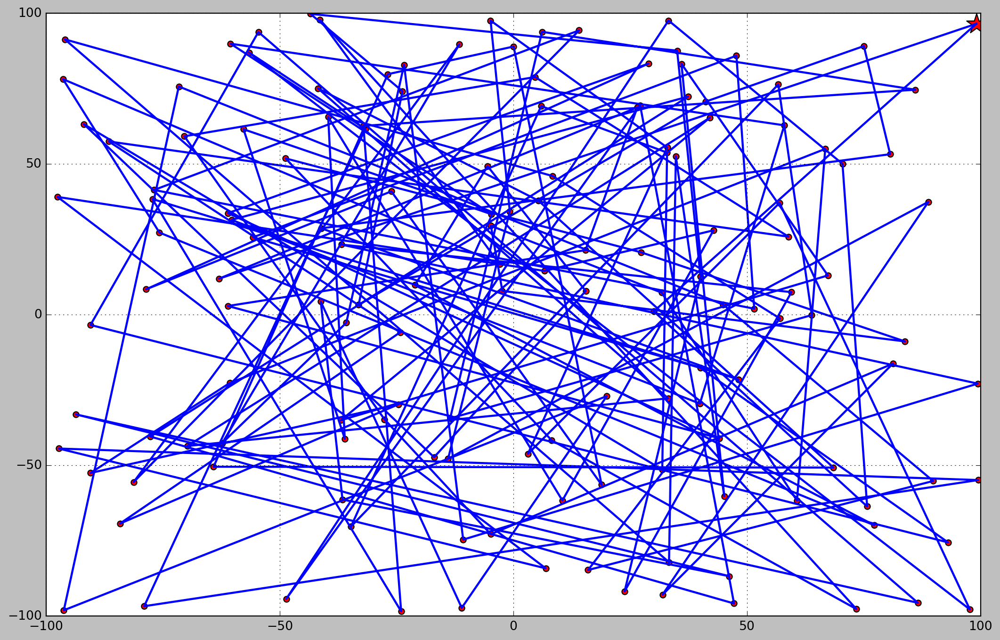

In [34]:
coords=get_coords(route)
plt.plot(coords[0], coords[1], 'b-', linewidth=2)
plt.scatter(data.x, data.y, c='r', s=30)
plt.scatter(data.iloc[0].x, data.iloc[0].y, marker='*', c='r', s=400)
plt.axis([-100,100,-100,100])
plt.grid(True)

## Let's see what 2-opt heuristic can do

In [35]:
%time twoOpt(route)

exchanging 0-2,1-3 with 0-1,2-3 => save=6.263294946633721 => cost: 16496.25082776565
exchanging 0-3,2-4 with 0-2,3-4 => save=0.9119698320696443 => cost: 16495.33885793358
exchanging 0-4,3-5 with 0-3,4-5 => save=10.218711467562343 => cost: 16485.12014646602
exchanging 0-12,4-13 with 0-4,12-13 => save=40.25321174065263 => cost: 16444.866934725367
exchanging 0-2,12-4 with 0-12,2-4 => save=15.337281160533706 => cost: 16429.529653564834
exchanging 0-3,2-5 with 0-2,3-5 => save=166.3017044579684 => cost: 16263.227949106866
exchanging 0-41,3-42 with 0-3,41-42 => save=7.534241164117645 => cost: 16255.693707942748
exchanging 0-35,41-34 with 0-41,35-34 => save=41.65152524803301 => cost: 16214.042182694715
exchanging 0-12,35-11 with 0-35,12-11 => save=17.98962287204253 => cost: 16196.052559822672
exchanging 0-73,12-74 with 0-12,73-74 => save=19.806763032123968 => cost: 16176.245796790548
exchanging 0-4,73-12 with 0-73,4-12 => save=10.143438500356524 => cost: 16166.102358290193
exchanging 0-31,4-32

exchanging 77-101,102-99 with 77-102,101-99 => save=36.471096137347814 => cost: 13097.078097889827
exchanging 77-103,101-126 with 77-101,103-126 => save=0.8248876275048929 => cost: 13096.253210262323
exchanging 77-92,103-94 with 77-103,92-94 => save=4.434500948423803 => cost: 13091.818709313899
exchanging 77-90,92-103 with 77-92,90-103 => save=0.9879788007236385 => cost: 13090.830730513175
exchanging 77-101,90-126 with 77-90,101-126 => save=8.953578083946852 => cost: 13081.877152429228
exchanging 77-128,101-104 with 77-101,128-104 => save=1.1853221612622207 => cost: 13080.691830267966
exchanging 77-104,128-89 with 77-128,104-89 => save=19.194094192629635 => cost: 13061.497736075336
exchanging 77-85,104-84 with 77-104,85-84 => save=5.961495294179372 => cost: 13055.536240781157
exchanging 77-84,85-73 with 77-85,84-73 => save=32.631306291422014 => cost: 13022.904934489736
exchanging 77-149,84-0 with 77-84,149-0 => save=14.15297592193275 => cost: 13008.751958567804
exchanging 77-148,149-14

exchanging 129-133,132-134 with 129-132,133-134 => save=100.44524522986629 => cost: 11234.543171866157
exchanging 129-141,133-140 with 129-133,141-140 => save=30.953263506763193 => cost: 11203.589908359394
exchanging 129-142,141-148 with 129-141,142-148 => save=13.18457670893261 => cost: 11190.405331650461
exchanging 129-148,142-135 with 129-142,148-135 => save=25.45520731934087 => cost: 11164.95012433112
exchanging 129-145,148-144 with 129-148,145-144 => save=44.865771070742284 => cost: 11120.084353260378
exchanging 129-149,145-140 with 129-145,149-140 => save=5.637608684895895 => cost: 11114.446744575482
exchanging 129-147,149-146 with 129-149,147-146 => save=147.3024398669252 => cost: 10967.144304708556
exchanging 129-148,147-144 with 129-147,148-144 => save=0.33744626201880124 => cost: 10966.806858446536
exchanging 129-145,148-146 with 129-148,145-146 => save=14.580439787489894 => cost: 10952.226418659047
exchanging 129-144,145-81 with 129-145,144-81 => save=31.23812680162584 => co

exchanging 83-31,35-37 with 83-35,31-37 => save=2.254553722780841 => cost: 9412.875108130818
exchanging 83-73,31-12 with 83-31,73-12 => save=1.953905711015281 => cost: 9410.921202419802
exchanging 83-3,73-29 with 83-73,3-29 => save=2.005036994378102 => cost: 9408.916165425424
exchanging 77-73,83-29 with 77-83,73-29 => save=3.295783873324112 => cost: 9405.6203815521
exchanging 9-31,131-12 with 9-131,31-12 => save=0.9163633294423903 => cost: 9404.704018222657
exchanging 31-123,131-128 with 31-131,123-128 => save=14.599801284233983 => cost: 9390.104216938424
exchanging 77-49,73-12 with 77-73,49-12 => save=0.017309927757501953 => cost: 9390.086907010666
exchanging 77-83,49-29 with 77-49,83-29 => save=13.700190526783423 => cost: 9376.386716483883
exchanging 42-35,92-37 with 42-92,35-37 => save=8.356638905332119 => cost: 9368.03007757855
exchanging 92-54,37-18 with 92-37,54-18 => save=9.145718142653052 => cost: 9358.884359435899
exchanging 92-116,54-120 with 92-54,116-120 => save=5.440300082

exchanging 120-23,106-122 with 120-106,23-122 => save=11.577357909331141 => cost: 7965.029027321813
exchanging 120-22,23-21 with 120-23,22-21 => save=177.6630949803868 => cost: 7787.365932341427
exchanging 120-52,22-72 with 120-22,52-72 => save=21.04567556209068 => cost: 7766.320256779336
exchanging 120-53,52-64 with 120-52,53-64 => save=8.559501976993687 => cost: 7757.7607548023425
exchanging 120-64,53-66 with 120-53,64-66 => save=1.9240719790928438 => cost: 7755.836682823249
exchanging 120-52,64-53 with 120-64,52-53 => save=4.485595277327661 => cost: 7751.3510875459215
exchanging 120-53,52-66 with 120-52,53-66 => save=3.463700889676204 => cost: 7747.887386656245
exchanging 120-103,53-90 with 120-53,103-90 => save=15.887796951989316 => cost: 7731.999589704256
exchanging 120-127,103-106 with 120-103,127-106 => save=43.935798772641334 => cost: 7688.063790931615
exchanging 120-122,127-25 with 120-127,122-25 => save=18.71115784491991 => cost: 7669.352633086694
exchanging 120-106,122-103 w

exchanging 22-142,60-141 with 22-60,142-141 => save=3.743968715792363 => cost: 5896.076817111032
exchanging 22-8,142-62 with 22-142,8-62 => save=79.46719291609796 => cost: 5816.609624194934
exchanging 22-132,8-142 with 22-8,132-142 => save=12.333763702530462 => cost: 5804.275860492404
exchanging 22-93,132-100 with 22-132,93-100 => save=44.710333188847244 => cost: 5759.565527303556
exchanging 22-108,93-109 with 22-93,108-109 => save=20.323475352798596 => cost: 5739.242051950758
exchanging 22-123,108-124 with 22-108,123-124 => save=15.235275297430263 => cost: 5724.0067766533275
exchanging 22-55,123-70 with 22-123,55-70 => save=31.214512844795337 => cost: 5692.792263808532
exchanging 22-60,55-135 with 22-55,60-135 => save=0.04164983139818901 => cost: 5692.750613977134
exchanging 22-108,60-93 with 22-60,108-93 => save=0.46709680274818766 => cost: 5692.283517174385
exchanging 22-65,108-10 with 22-108,65-10 => save=3.9716494587551665 => cost: 5688.31186771563
exchanging 22-134,65-135 with 22

exchanging 47-80,78-82 with 47-78,80-82 => save=39.526007364421304 => cost: 4403.848822691251
exchanging 47-82,80-144 with 47-80,82-144 => save=0.6149000571588203 => cost: 4403.233922634093
exchanging 47-40,82-146 with 47-82,40-146 => save=5.97598629423149 => cost: 4397.257936339861
exchanging 47-21,40-144 with 47-40,21-144 => save=31.354147510544394 => cost: 4365.903788829317
exchanging 47-48,21-111 with 47-21,48-111 => save=11.970113893964978 => cost: 4353.9336749353515
exchanging 47-23,48-43 with 47-48,23-43 => save=49.80028346313492 => cost: 4304.133391472216
exchanging 111-48,21-43 with 111-21,48-43 => save=100.54045549666864 => cost: 4203.592935975547
exchanging 111-142,48-8 with 111-48,142-8 => save=14.69814960001706 => cost: 4188.89478637553
exchanging 111-10,142-108 with 111-142,10-108 => save=0.8559226044578594 => cost: 4188.038863771072
exchanging 111-61,10-62 with 111-10,61-62 => save=0.28399061668596914 => cost: 4187.754873154387
exchanging 111-56,61-68 with 111-61,56-68 =

exchanging 90-51,1-66 with 90-1,51-66 => save=5.571604332934598 => cost: 3118.38850662932
exchanging 66-20,55-147 with 66-55,20-147 => save=5.645907851237734 => cost: 3112.7425987780825
exchanging 20-141,71-148 with 20-71,141-148 => save=51.591449177200445 => cost: 3061.151149600882
exchanging 20-6,141-14 with 20-141,6-14 => save=8.833619191748184 => cost: 3052.3175304091337
exchanging 20-148,6-71 with 20-6,148-71 => save=0.26394869853841385 => cost: 3052.053581710595
exchanging 20-60,148-135 with 20-148,60-135 => save=33.07047680689261 => cost: 3018.9831049037025
exchanging 20-147,60-33 with 20-60,147-33 => save=1.757209841030555 => cost: 3017.225895062672
exchanging 19-135,126-148 with 19-126,135-148 => save=6.326118340696198 => cost: 3010.8997767219757
exchanging 19-60,135-33 with 19-135,60-33 => save=2.26189675170005 => cost: 3008.6378799702757
exchanging 90-19,51-60 with 90-51,19-60 => save=5.427323170459381 => cost: 3003.2105567998165
exchanging 53-20,116-66 with 53-116,20-66 => 

exchanging 32-139,41-71 with 32-41,139-71 => save=21.97871464359612 => cost: 2187.1792888690807
exchanging 71-70,126-31 with 71-126,70-31 => save=0.4757197376470117 => cost: 2186.7035691314336
exchanging 71-148,70-9 with 71-70,148-9 => save=2.7786540996745472 => cost: 2183.924915031759
exchanging 71-101,148-104 with 71-148,101-104 => save=1.6067715492688848 => cost: 2182.31814348249
exchanging 71-76,101-4 with 71-101,76-4 => save=9.682820377501479 => cost: 2172.6353231049884
exchanging 139-71,41-76 with 139-41,71-76 => save=0.05679161378920128 => cost: 2172.578531491199
exchanging 4-89,143-128 with 4-143,89-128 => save=2.179914907926989 => cost: 2170.398616583272
exchanging 143-148,128-104 with 143-128,148-104 => save=7.5228897141963 => cost: 2162.8757268690756
exchanging 143-6,148-31 with 143-148,6-31 => save=1.1654546364054532 => cost: 2161.7102722326704
exchanging 148-70,31-9 with 148-31,70-9 => save=0.1292541438633492 => cost: 2161.581018088807
exchanging 31-131,9-128 with 31-9,131

## Plot improved path

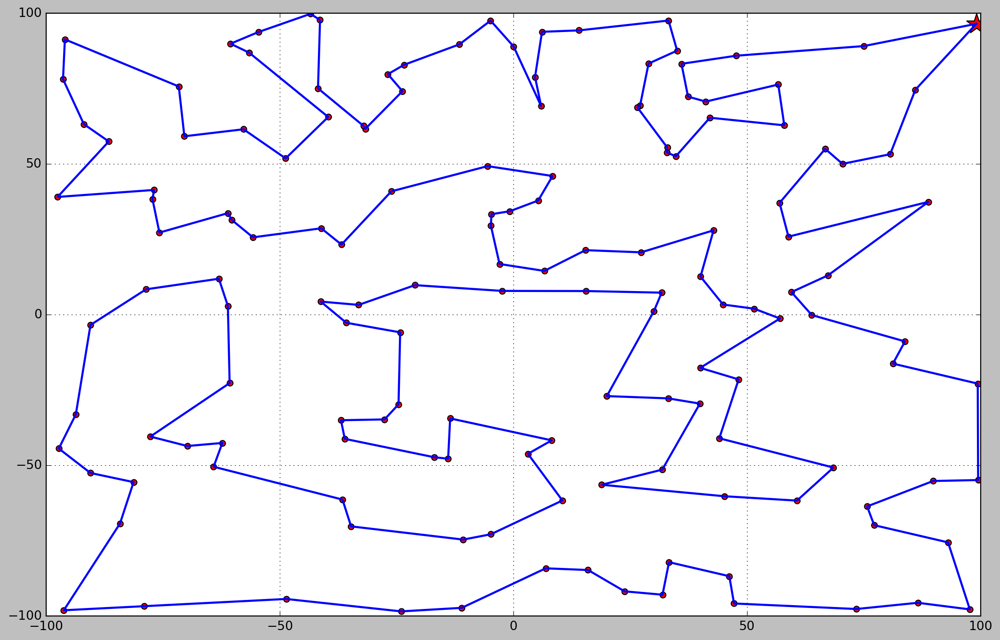

In [36]:
coords=get_coords(route)
plt.plot(coords[0], coords[1], 'b-', linewidth=2)
plt.scatter(data.x, data.y, c='r', s=30)
plt.scatter(data.iloc[0].x, data.iloc[0].y, marker='*', c='r', s=400)
plt.axis([-100,100,-100,100])
plt.grid(True)

## Yes, it's beautiful what this heuristic can do.

## Only again extremely slower. It's best suited to improve a path, not to build one.

# Scenario: farthest depot, several vans, no clustering

## Let's apply a sequential NN algorithm, but including a max cost constraint

In [37]:
%time result_paths = sequential_nn(400)

van 1: 385.64822798111754
van 2: 396.65132151762236
van 3: 356.93203827425646
van 4: 396.0161561312648
van 5: 387.061496278307
van 6: 395.6147269472501
van 7: 369.199156243418
van 8: 394.6734767469922
van 9: 397.84112119751114
van 10: 398.459895479128
van 11: 398.88707002367426
van 12: 393.1275886242274
van 13: 399.0252974546198
van 14: 369.5354695202354
van 15: 399.04095929693733
van 16: 398.1246462968952
van 17: 390.2323088432243
van 18: 391.6922432861831
van 19: 396.62966713208937
van 20: 397.37088575736055
van 21: 398.69882895151926
van 22: 398.71167524672734
van 23: 401.9265755043099
van 24: 405.5614801848182
van 25: 405.6059533951813
van 26: 406.6405588064364
van 27: 409.6579507334966
van 28: 416.22815658152126
van 29: 426.0013563494297
van 30: 427.5654816187484
van 31: 428.5781354316992
van 32: 438.7764370279704
van 33: 439.2553078706148
van 34: 445.7400163235422
van 35: 447.1961602342642
van 36: 461.09599384348525
van 37: 464.4374453992292
van 38: 471.7901899743616
van 39: 482.

## Plot result paths

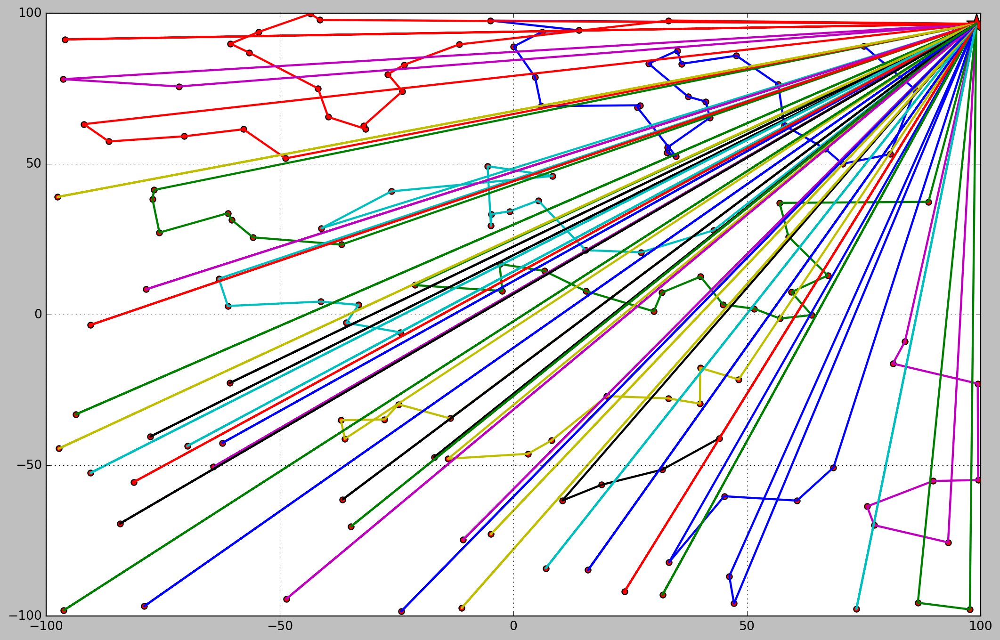

In [38]:
for path in result_paths:
    coords=get_coords(path)
    plt.plot(coords[0], coords[1], linewidth=2)
plt.scatter(data.x, data.y, c='r', s=30)
plt.scatter(data.iloc[0].x, data.iloc[0].y, marker='*', c='r', s=400)
plt.axis([-100,100,-100,100])
plt.grid(True)

## Max cost 400 doesn't quite work here, as the distances are much larger

In [53]:
%time result_paths = sequential_nn(500)

van 1: 493.1613509811791
van 2: 498.37402590912467
van 3: 499.57415652250484
van 4: 490.0564767221547
van 5: 497.67366460125766
van 6: 491.0474410501304
van 7: 476.1857519522164
van 8: 487.87440569372217
van 9: 462.17325815341474
van 10: 486.2976818275437
van 11: 498.3091236408933
van 12: 466.4397450832517
van 13: 464.4374453992292
van 14: 494.26350457825447
van 15: 525.5364809069648
van 16: 551.3280289580272
CPU times: user 573 ms, sys: 20.1 ms, total: 593 ms
Wall time: 588 ms


## Plot result paths

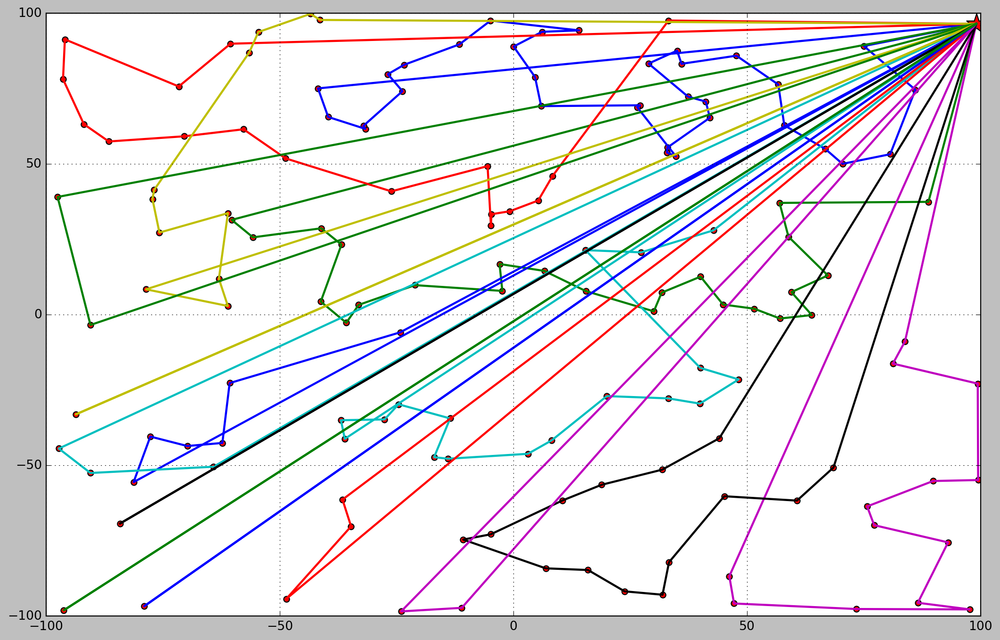

In [54]:
for path in result_paths:
    coords=get_coords(path)
    plt.plot(coords[0], coords[1], linewidth=2)
plt.scatter(data.x, data.y, c='r', s=30)
plt.scatter(data.iloc[0].x, data.iloc[0].y, marker='*', c='r', s=400)
plt.axis([-100,100,-100,100])
plt.grid(True)

## Let's improve them with a 2-opt heuristic

In [55]:
%time improve_result_paths()

Starting path 1/16
exchanging 84-134,77-0 with 84-77,134-0 => save=17.58671573136749 => cost: 475.57463524981165
exchanging 84-78,134-87 with 84-134,78-87 => save=3.448531857292238 => cost: 472.12610339251944
exchanging 84-26,78-17 with 84-78,26-17 => save=0.9202145322444295 => cost: 471.205888860275
exchanging 84-101,26-76 with 84-26,101-76 => save=7.308337390791209 => cost: 463.8975514694838
exchanging 84-9,101-143 with 84-101,9-143 => save=15.313536613246896 => cost: 448.5840148562369
exchanging 84-104,9-73 with 84-9,104-73 => save=7.1223751990253135 => cost: 441.46163965721155
exchanging 101-26,32-76 with 101-32,26-76 => save=1.0469139853102263 => cost: 440.41472567190135
exchanging 101-134,26-87 with 101-26,134-87 => save=0.4107571223249522 => cost: 440.00396854957637
exchanging 101-87,134-138 with 101-134,87-138 => save=7.020145644829121 => cost: 432.9838229047472
exchanging 101-76,87-139 with 101-87,76-139 => save=14.65802354842912 => cost: 418.3257993563181
exchanging 71-148,6-

## Plot improved paths

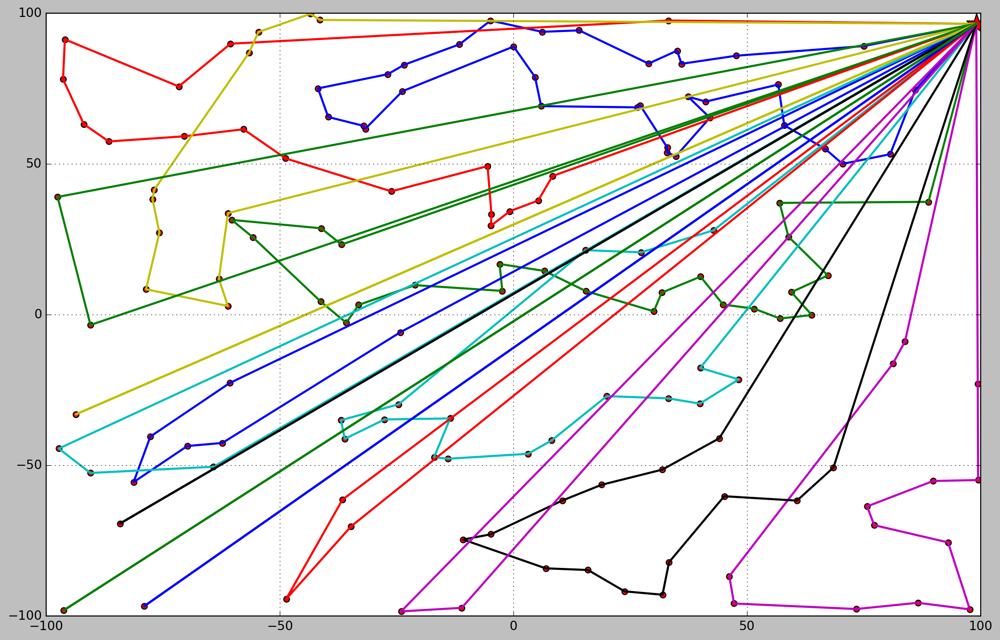

In [56]:
for path in result_paths:
    coords=get_coords(path)
    plt.plot(coords[0], coords[1], linewidth=2)
plt.scatter(data.x, data.y, c='r', s=30)
plt.scatter(data.iloc[0].x, data.iloc[0].y, marker='*', c='r', s=400)
plt.axis([-100,100,-100,100])
plt.grid(True)

## Nice! Several clean paths, but some vans had to do only one distant delivery.

## As we see, it is better to increase the max cost again.

In a real system, there should be a way to estimate it based on a full day of work (generally 8 hours).
Let's try again.

In [67]:
%time result_paths = sequential_nn(800)

van 1: 792.9220639985251
van 2: 793.9102149907774
van 3: 749.3577273914822
van 4: 769.1224381882283
CPU times: user 1.03 s, sys: 18.5 ms, total: 1.05 s
Wall time: 1.05 s


## Plot result paths

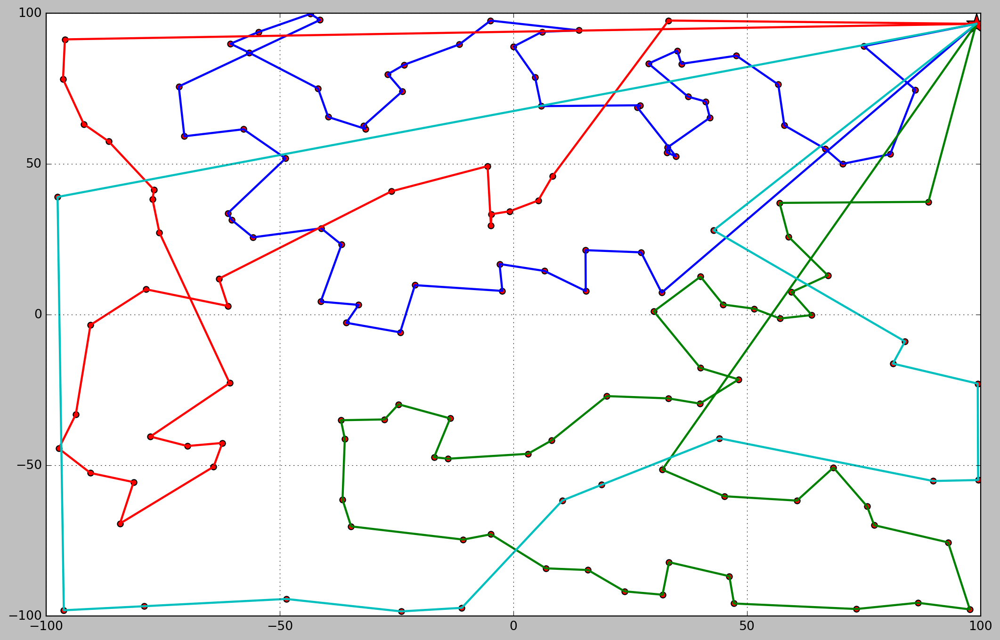

In [68]:
for path in result_paths:
    coords=get_coords(path)
    plt.plot(coords[0], coords[1], linewidth=2)
plt.scatter(data.x, data.y, c='r', s=30)
plt.scatter(data.iloc[0].x, data.iloc[0].y, marker='*', c='r', s=400)
plt.axis([-100,100,-100,100])
plt.grid(True)

## Let's improve them with a 2-opt heuristic

In [69]:
%time improve_result_paths()

Starting path 1/4
exchanging 84-51,77-0 with 84-77,51-0 => save=11.952005586800027 => cost: 780.9700584117251
exchanging 84-148,51-126 with 84-51,148-126 => save=12.85241513422433 => cost: 768.1176432775007
exchanging 84-6,148-71 with 84-148,6-71 => save=1.4128869412341345 => cost: 766.7047563362667
exchanging 84-131,6-85 with 84-6,131-85 => save=2.436521710300539 => cost: 764.2682346259661
exchanging 84-104,131-73 with 84-131,104-73 => save=7.964167836250802 => cost: 756.3040667897153
exchanging 41-101,139-32 with 41-139,101-32 => save=2.292807396509147 => cost: 754.0112593932062
exchanging 87-26,78-17 with 87-78,26-17 => save=0.17155006280330554 => cost: 753.8397093304029
exchanging 134-59,27-118 with 134-27,59-118 => save=14.854129457526632 => cost: 738.9855798728763
exchanging 109-27,13-118 with 109-13,27-118 => save=0.761087916943886 => cost: 738.2244919559324
exchanging 66-51,147-126 with 66-147,51-126 => save=6.004072981449653 => cost: 732.2204189744828
Starting path 2/4
exchang

## Plot improved paths

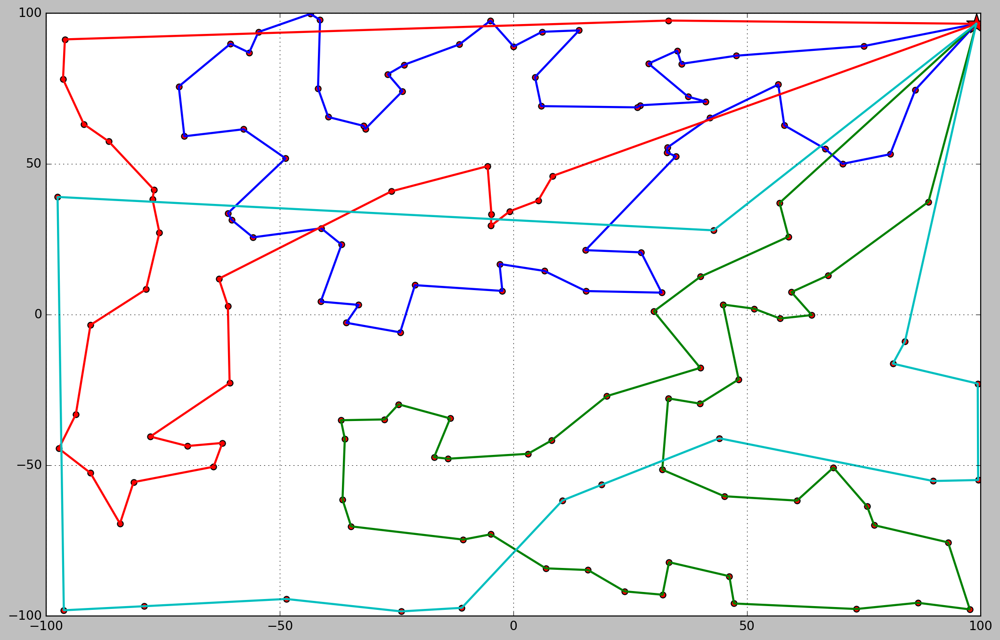

In [70]:
for path in result_paths:
    coords=get_coords(path)
    plt.plot(coords[0], coords[1], linewidth=2)
plt.scatter(data.x, data.y, c='r', s=30)
plt.scatter(data.iloc[0].x, data.iloc[0].y, marker='*', c='r', s=400)
plt.axis([-100,100,-100,100])
plt.grid(True)

## Nice, clean paths. But with several overlaps.

### In a real system, it should be analysed not only the cost (distance), but also the number of points in the route. Each one introduces a delay, as the driver has to park, walk, wait the customer, etc.

# Scenario: farthest depot, several vans, KMeans clustering

## Compute delivery clusters

In [43]:
from sklearn.cluster import KMeans

work_per_van=20 #how many deliveries each van will start, ie granularity; a better approach would be capacity.
model = KMeans(n_clusters=1+size//work_per_van, init='k-means++', random_state=0)
%time model.fit(data[['x', 'y']])

CPU times: user 91.4 ms, sys: 10.6 ms, total: 102 ms
Wall time: 111 ms


KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=8, n_init=10, n_jobs=1, precompute_distances='auto',
    random_state=0, tol=0.0001, verbose=0)

## Plot clusters

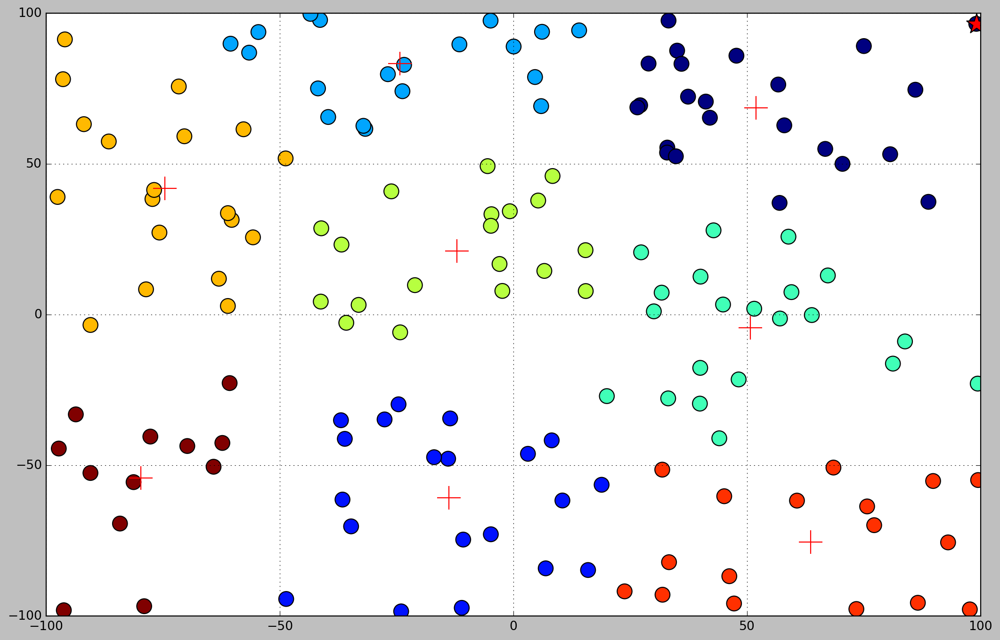

In [44]:
plt.scatter(data.x, data.y, marker='o', c=model.labels_, s=200)
plt.scatter(model.cluster_centers_[:,0], model.cluster_centers_[:,1], marker='+', c='r', s=500)
plt.scatter(data.iloc[0].x, data.iloc[0].y, marker='*', c='r', s=400)
plt.axis([-100,100,-100,100])
plt.grid(True)

## Let's apply a greedy NN algorithm sequentially, on each of the clusters

In [45]:
%time result_paths = greedy_nn_clusters()    

van 1: 390.25298877225174
van 2: 687.7516428319581
van 3: 382.7248611037869
van 4: 505.82568809746317
van 5: 478.6115152097322
van 6: 644.9250908928291
van 7: 595.3986361541317
van 8: 665.6387979350595
CPU times: user 154 ms, sys: 16.6 ms, total: 170 ms
Wall time: 165 ms


## Plot result paths

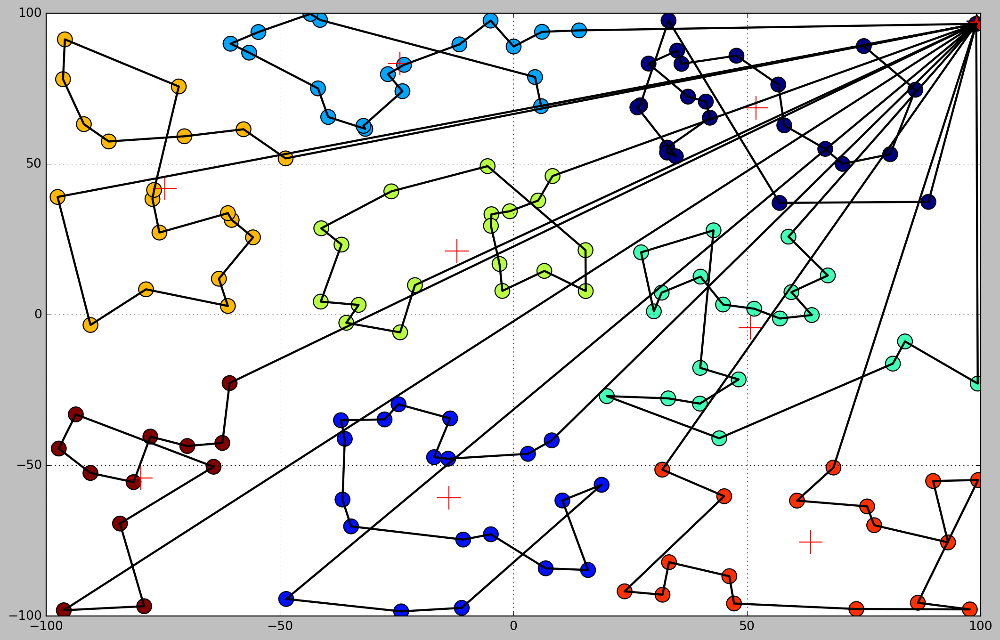

In [46]:
plt.scatter(data.x, data.y, marker='o', c=model.labels_, s=200)
plt.scatter(model.cluster_centers_[:,0], model.cluster_centers_[:,1], marker='+', c='r', s=500)
for path in result_paths:
    coords=get_coords(path)
    plt.plot(coords[0], coords[1], 'k-', linewidth=2)
plt.scatter(data.iloc[0].x, data.iloc[0].y, marker='*', c='r', s=400)
plt.axis([-100,100,-100,100])
plt.grid(True)

## Let's improve them with a 2-opt heuristic

In [47]:
%time improve_result_paths()

Starting path 1/8
exchanging 77-4,83-29 with 77-83,4-29 => save=0.8194748732687884 => cost: 389.43351389898294
exchanging 0-77,84-4 with 0-84,77-4 => save=14.660530195135081 => cost: 374.77298370384784
exchanging 77-35,84-0 with 77-84,35-0 => save=15.678266575652529 => cost: 359.0947171281953
exchanging 77-29,35-83 with 77-35,29-83 => save=0.6815242531813084 => cost: 358.41319287501403
exchanging 77-83,29-3 with 77-29,83-3 => save=17.425605221119945 => cost: 340.9875876538941
exchanging 128-6,89-4 with 128-89,6-4 => save=6.729433462630183 => cost: 334.2581541912639
exchanging 104-9,128-143 with 104-128,9-143 => save=1.7854469411969767 => cost: 332.4727072500669
exchanging 131-126,31-148 with 131-31,126-148 => save=2.1351116524050937 => cost: 330.3375955976618
exchanging 6-143,128-89 with 6-128,143-89 => save=5.407506824441722 => cost: 324.93008877322006
Starting path 2/8
exchanging 30-5,34-0 with 30-34,5-0 => save=4.481243727960788 => cost: 683.2703991039973
exchanging 30-18,5-121 with

## Plot improved paths

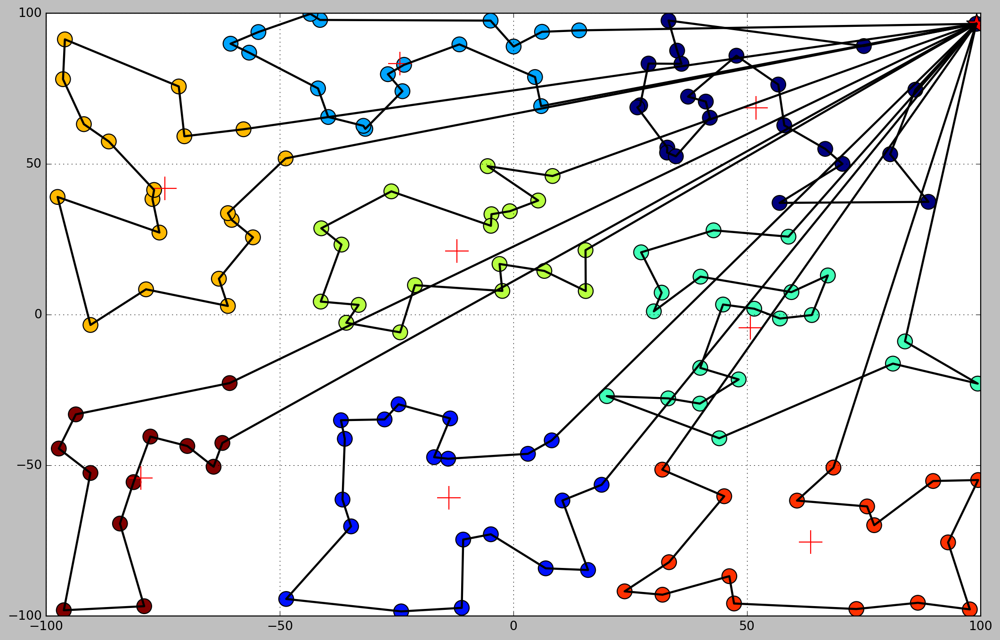

In [48]:
plt.scatter(data.x, data.y, marker='o', c=model.labels_, s=200)
plt.scatter(model.cluster_centers_[:,0], model.cluster_centers_[:,1], marker='+', c='r', s=500)
for path in result_paths:
    coords=get_coords(path)
    plt.plot(coords[0], coords[1], 'k-', linewidth=2)
plt.scatter(data.iloc[0].x, data.iloc[0].y, marker='*', c='r', s=400)
plt.axis([-100,100,-100,100])
plt.grid(True)

## Very cool subsections! Aproximately the same number of deliveries in each route!

### But some routes are way longer than others. Some vans maybe will have to do an extra hour or two.